# <center>Código/Articulo_La complejidad del sistema geoelectoral mexicano a nivel municipal <center>
## <center>Análisis de Agrupamiento y Estratificacion <center>

<br>

#### <center>Autor: Miguel David Alvarez Hernández (mdalvarezh@gmail.com)<center>

In [2]:
import datetime
now = datetime.datetime.now()
print ("Última versión:")
print (now.strftime("%Y-%m-%d %H:%M:%S"))

Última versión:
2021-08-10 23:01:05


# Setup

In [2]:
import pandas as pd  
import numpy as np
import pandas_profiling
from itertools import combinations 
from dateutil.parser import parse 
import matplotlib as mpl
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
from matplotlib import pyplot
from matplotlib.lines import Line2D
import seaborn as sns
import plotly.express as px

In [3]:
#parametros de las gráficas 3d
elev = 50.0
azim = 10.0

#se define diccionario de colores
color_dict = dict({'G0':'blue',
                  'G1':'green',
                  'G2': 'orange',
                  'G3': 'grey',
                  'G4': 'red',
                  'G5': 'magenta'})

#personalizar leyenda
legend_elements_6 = [Line2D([0], [0], marker='o', markerfacecolor='magenta', color='w', label='G5'),
                   Line2D([0], [0], marker='o', markerfacecolor='red', color='w', label='G4'),
                   Line2D([0], [0], marker='o', markerfacecolor='grey', color='w', label='G3'),
                   Line2D([0], [0], marker='o', markerfacecolor='orange', color='w', label='G2'),
                   Line2D([0], [0], marker='o', markerfacecolor='green', color='w', label='G1'),
                   Line2D([0], [0], marker='o', markerfacecolor='blue', color='w', label='G0')]

legend_elements_5 = [Line2D([0], [0], marker='o', markerfacecolor='red', color='w', label='G4'),
                   Line2D([0], [0], marker='o', markerfacecolor='grey', color='w', label='G3'),
                   Line2D([0], [0], marker='o', markerfacecolor='orange', color='w', label='G2'),
                   Line2D([0], [0], marker='o', markerfacecolor='green', color='w', label='G1'),
                   Line2D([0], [0], marker='o', markerfacecolor='blue', color='w', label='G0')]

legend_elements_4 = [Line2D([0], [0], marker='o', markerfacecolor='grey', color='w', label='G3'),
                   Line2D([0], [0], marker='o', markerfacecolor='orange', color='w', label='G2'),
                   Line2D([0], [0], marker='o', markerfacecolor='green', color='w', label='G1'),
                   Line2D([0], [0], marker='o', markerfacecolor='blue', color='w', label='G0')]

# Importación de datos procesados

In [4]:
#datos procesados
datos = pd.read_csv("C:/Users/miguel.alvarez/Google Drive/PREPRINTS_PONENCIAS/[Articulo]_Complejidad sistema geo-electoral_municipios/Code_Mun/1_Procesamiento/Resultados_Datos-procesados_mun2019.csv", encoding='utf-8')

In [5]:
print(datos.dtypes)
datos

EDO                   int64
NOMBRE_ESTADO        object
MUN                   int64
NOMBRE_MUNICIPIO     object
Coef_Var_PE         float64
Coef_Var_LNE        float64
Var_Prop_PE         float64
Var_Prop_LNE        float64
Autocorr_PE         float64
Autocorr_LNE        float64
Razon_LNE_PE        float64
PE                  float64
LNE                 float64
TC_LNE_2019         float64
NUM_SECC_RUR          int64
Area_Km2            float64
Densidad_LNE        float64
dtype: object


,EDO,NOMBRE_ESTADO,MUN,NOMBRE_MUNICIPIO,Coef_Var_PE,Coef_Var_LNE,Var_Prop_PE,Var_Prop_LNE,Autocorr_PE,Autocorr_LNE,Razon_LNE_PE,PE,LNE,TC_LNE_2019,NUM_SECC_RUR,Area_Km2,Densidad_LNE
0,1,AGUASCALIENTES,10,SAN FRANCISCO DE LOS ROMO,0.009708,0.008903,0.020041,0.017733,0.988393,0.970914,0.989272,35518.0,34917.0,0.037498,3,9.791576,3566.024547
1,1,AGUASCALIENTES,8,SAN JOSE DE GRACIA,0.003117,0.002356,0.005584,0.008887,0.791791,0.951687,0.991803,7004.0,6914.0,0.000289,4,148.866104,46.444421
2,1,AGUASCALIENTES,9,TEPEZALA,0.003911,0.005070,0.007903,0.011921,0.969294,0.832575,0.990635,15733.0,15545.0,0.005108,6,6.271495,2478.675412
3,1,AGUASCALIENTES,11,EL LLANO,0.005733,0.004768,0.009983,0.014232,0.938868,0.962703,0.991016,15298.0,15067.0,-0.003373,6,10.006312,1505.749552
4,1,AGUASCALIENTES,2,ASIENTOS,0.005650,0.004824,0.009252,0.015397,0.993797,0.837235,0.989080,34722.0,34222.0,0.001874,11,23.049424,1484.722551
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2453,32,ZACATECAS,45,TEPECHITLAN,0.002327,0.001991,0.017748,0.021905,0.992283,0.577314,0.983523,7061.0,6959.0,0.066677,13,190.978234,36.438707
2454,32,ZACATECAS,14,GENERAL FRANCISCO R. MURGUIA,0.004739,0.002967,0.022931,0.026072,0.982714,0.911464,0.986450,17610.0,17372.0,0.082705,32,1190.248462,14.595272
2455,32,ZACATECAS,44,TABASCO,0.005701,0.005293,0.032716,0.035416,0.952155,0.928948,0.983221,12689.0,12527.0,0.100307,16,235.714183,53.144872
2456,32,ZACATECAS,9,CHALCHIHUITES,0.004951,0.003692,0.019649,0.024771,0.655389,0.819352,0.982861,8339.0,8222.0,0.075052,10,13.707054,599.837116


In [6]:
#se reordena y eliminan del dataframe las variables que no se usarán
datos_mun = datos.drop(columns=['Coef_Var_PE', 'Var_Prop_PE', 'Autocorr_PE','Area_Km2'])
datos_mun = datos_mun.reindex(columns= ['EDO','NOMBRE_ESTADO','MUN','NOMBRE_MUNICIPIO','NUM_SECC_RUR','LNE','Densidad_LNE','Razon_LNE_PE','TC_LNE_2019','Coef_Var_LNE','Var_Prop_LNE','Autocorr_LNE'])

#verificar si hay valores nulos en datos_mun
datos_mun.isnull().sum()

EDO                 0
NOMBRE_ESTADO       0
MUN                 0
NOMBRE_MUNICIPIO    0
NUM_SECC_RUR        0
LNE                 0
Densidad_LNE        0
Razon_LNE_PE        0
TC_LNE_2019         0
Coef_Var_LNE        0
Var_Prop_LNE        0
Autocorr_LNE        2
dtype: int64

In [7]:
#se eliminan las filas (municipios) con valores vacíos
datos_mun_limpio = datos_mun.dropna()
datos_mun_limpio = datos_mun_limpio.reset_index(drop=True) #para reordenar el índice del nuevo dataframe
datos_mun_limpio.isnull().sum()

EDO                 0
NOMBRE_ESTADO       0
MUN                 0
NOMBRE_MUNICIPIO    0
NUM_SECC_RUR        0
LNE                 0
Densidad_LNE        0
Razon_LNE_PE        0
TC_LNE_2019         0
Coef_Var_LNE        0
Var_Prop_LNE        0
Autocorr_LNE        0
dtype: int64

In [8]:
#se transforman algunos indicadores para analizar escenarios
datos_mun_limpio_tf = datos_mun_limpio.copy()

#np-log de LNE, Densidad
datos_mun_limpio_tf['LNE'] = np.log(datos_mun_limpio_tf['LNE'])
datos_mun_limpio_tf['Densidad_LNE'] = np.log(datos_mun_limpio_tf['Densidad_LNE'])
#datos_mun_limpio_tf['NUM_SECC_RUR'] = np.log(datos_mun_limpio_tf['NUM_SECC_RUR']+1)

In [9]:
#se separan los indicadores de los metadatos 

#metadatos
metadatos = datos_mun_limpio[['EDO', 'NOMBRE_ESTADO', 'MUN', 'NOMBRE_MUNICIPIO']]

#8 indicadores (features)
datos_mun_limpio_f = datos_mun_limpio[['NUM_SECC_RUR','LNE', 'Densidad_LNE', 'Razon_LNE_PE', 'TC_LNE_2019', 'Coef_Var_LNE', 'Var_Prop_LNE','Autocorr_LNE']]

#8 indicadores con transformación log (features)
datos_mun_limpio_f_tf = datos_mun_limpio_tf[['NUM_SECC_RUR','LNE', 'Densidad_LNE', 'Razon_LNE_PE', 'TC_LNE_2019', 'Coef_Var_LNE', 'Var_Prop_LNE','Autocorr_LNE']]

#7 indicadores(features)
datos_mun_limpio_f_ind7 = datos_mun_limpio[['NUM_SECC_RUR','LNE', 'Densidad_LNE', 'Razon_LNE_PE', 'TC_LNE_2019', 'Coef_Var_LNE', 'Autocorr_LNE']]

#7 indicadores con transformación log (features)
datos_mun_limpio_f_tf_ind7 = datos_mun_limpio_tf[['NUM_SECC_RUR','LNE', 'Densidad_LNE', 'Razon_LNE_PE', 'TC_LNE_2019', 'Coef_Var_LNE', 'Autocorr_LNE']]

# Resultados de los escenarios PCA

In [10]:
#escenario con 7 indicadores (sin Coef_Var_Prop)
df_pca_results_ind7 = pd.read_csv("C:/Users/miguel.alvarez/Google Drive/PREPRINTS_PONENCIAS/[Articulo]_Complejidad sistema geo-electoral_municipios/Code_Mun/2_Exploratorio-PCA/Resultados_Mun_PCA_ind7.csv", dtype={'EDO':int,'MUN':int})

#formamos un np-array con las columnas_pca para la sección de métodos de agrupamiento
columnas_7pca = ['CP1', 'CP2', 'CP3','CP4', 'CP5', 'CP6','CP7']
columnas_7pca_3 = ['CP1', 'CP2', 'CP3']
x_pca = df_pca_results_ind7.loc[:, columnas_7pca_3].values

print(x_pca.shape)

(2456, 3)


Definición de la prueba de Hopkins (https://www.kaggle.com/ashydv/country-clustering-hierarchical-clustering-pca)

In [11]:
from sklearn.neighbors import NearestNeighbors
from random import sample
from numpy.random import uniform
import numpy as np
from math import isnan
 
def hopkins(X):
    d = X.shape[1]
    #d = len(vars) # columns
    n = len(X) # rows
    m = int(0.1 * n) 
    nbrs = NearestNeighbors(n_neighbors=1).fit(X.values)
 
    rand_X = sample(range(0, n, 1), m)
 
    ujd = []
    wjd = []
    for j in range(0, m):
        u_dist, _ = nbrs.kneighbors(uniform(np.amin(X,axis=0),np.amax(X,axis=0),d).reshape(1, -1), 2, return_distance=True)
        ujd.append(u_dist[0][1])
        w_dist, _ = nbrs.kneighbors(X.iloc[rand_X[j]].values.reshape(1, -1), 2, return_distance=True)
        wjd.append(w_dist[0][1])
 
    H = sum(ujd) / (sum(ujd) + sum(wjd))
    if isnan(H):
        print(ujd, wjd)
        H = 0
 
    return H

<br>

# Agrupamiento y construcción de la estratificación de complejidad electoral

## (7 indicadores, 3 CP)

### Analisis de hopkins

In [12]:
hopkins(pd.DataFrame(x_pca))

0.9754367867461262

### Análisis de silueta, dendograma y configuración óptima de grupos con Ward
Cálculo de los silhouette_scores para diferentes números de clusters en ward

For n_clusters = 2 The average silhouette_score is : 0.7833096821167509
For n_clusters = 3 The average silhouette_score is : 0.26020124716848825
For n_clusters = 4 The average silhouette_score is : 0.2581498406179149
For n_clusters = 5 The average silhouette_score is : 0.28166477517791494
For n_clusters = 6 The average silhouette_score is : 0.2855594159970792
For n_clusters = 7 The average silhouette_score is : 0.22351196302289245


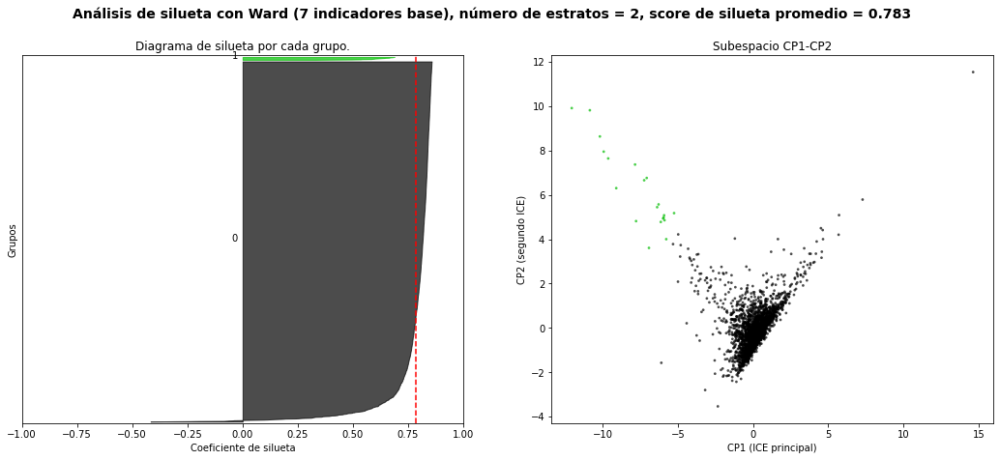

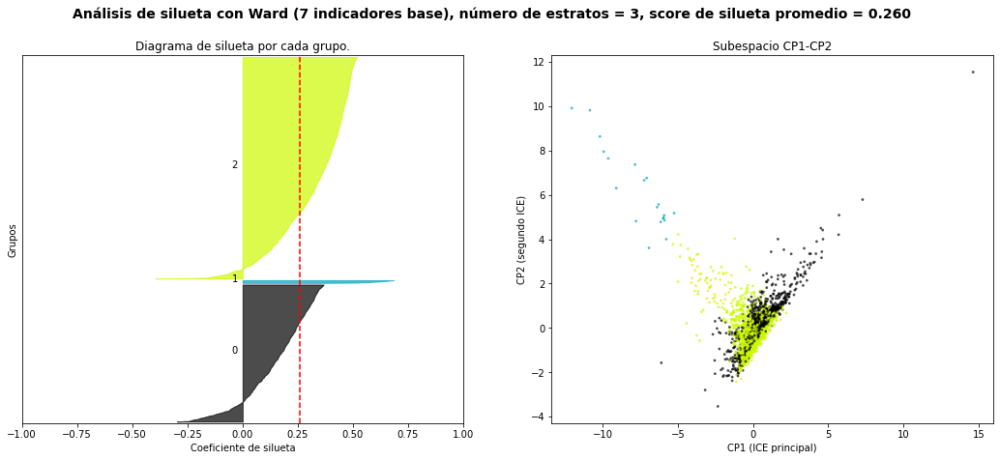

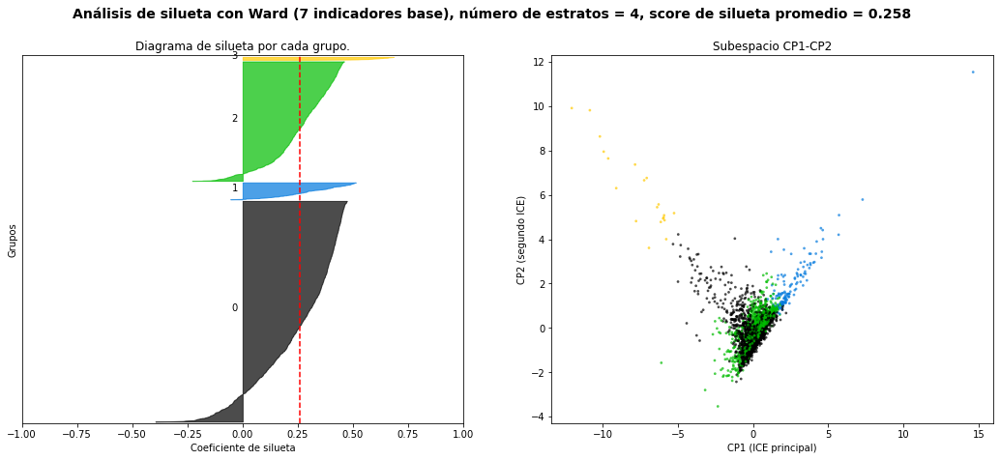

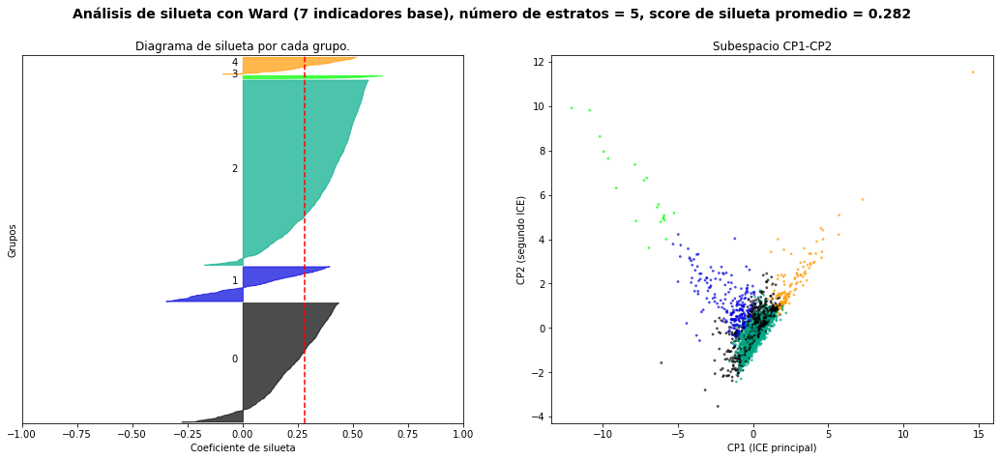

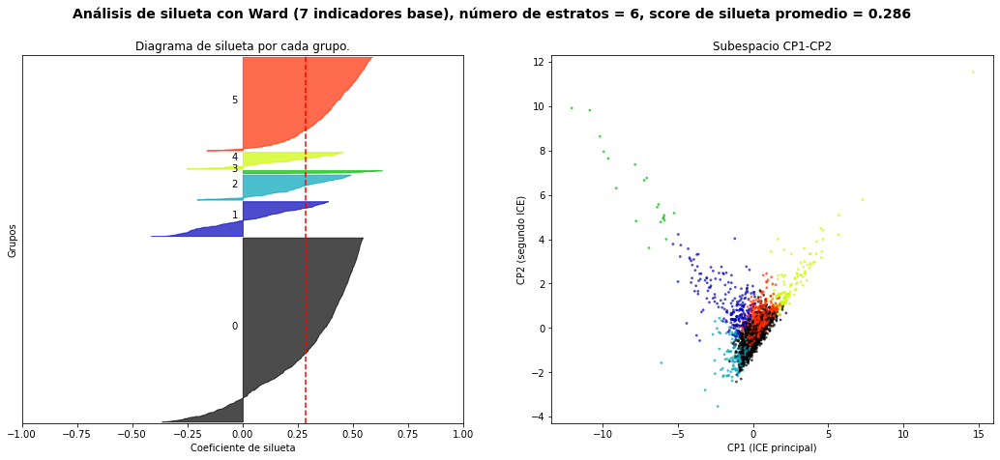

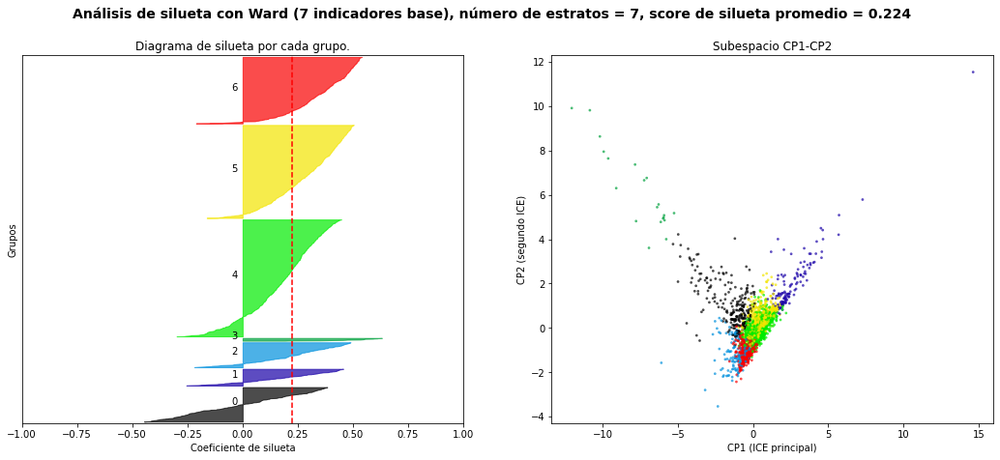

In [13]:
from sklearn.cluster import AgglomerativeClustering
from sklearn.metrics import silhouette_samples, silhouette_score
import matplotlib.cm as cm

#Datos en el espacio de las componentes principales
X=x_pca

#numero de clusters/grupos que serán analizados
range_n_clusters = [2, 3, 4, 5,6,7]

for n_clusters in range_n_clusters:
    # Create a subplot with 1 row and 2 columns
    fig, (ax1, ax2) = plt.subplots(1, 2)
    fig.set_size_inches(18, 7)

    # The 1st subplot is the silhouette plot
    # The silhouette coefficient can range from -1, 1 
    ax1.set_xlim([-1, 1])
    # The (n_clusters+1)*10 is for inserting blank space between silhouette
    # plots of individual clusters, to demarcate them clearly.
    ax1.set_ylim([0, len(X) + (n_clusters + 1) * 10])

    # Initialize the clusterer with n_clusters value and a random generator
    # seed of 0 for reproducibility.
    clusterer = AgglomerativeClustering(
        n_clusters=n_clusters, linkage='ward')
    cluster_labels = clusterer.fit_predict(X)

    # The silhouette_score gives the average value for all the samples.
    # This gives a perspective into the density and separation of the formed clusters
    silhouette_avg = silhouette_score(X, cluster_labels)
    print("For n_clusters =", n_clusters,
          "The average silhouette_score is :", silhouette_avg)

    # Compute the silhouette scores for each sample
    sample_silhouette_values = silhouette_samples(X, cluster_labels)

    y_lower = 10
    for i in range(n_clusters):
        # Aggregate the silhouette scores for samples belonging to
        # cluster i, and sort them
        ith_cluster_silhouette_values = \
            sample_silhouette_values[cluster_labels == i]

        ith_cluster_silhouette_values.sort()

        size_cluster_i = ith_cluster_silhouette_values.shape[0]
        y_upper = y_lower + size_cluster_i

        color = cm.nipy_spectral(float(i) / n_clusters)
        ax1.fill_betweenx(np.arange(y_lower, y_upper),
                          0, ith_cluster_silhouette_values,
                          facecolor=color, edgecolor=color, alpha=0.7)

        # Label the silhouette plots with their cluster numbers at the middle
        ax1.text(-0.05, y_lower + 0.5 * size_cluster_i, str(i))

        # Compute the new y_lower for next plot
        y_lower = y_upper + 10  # 10 for the 0 samples

    ax1.set_title("Diagrama de silueta por cada grupo.")
    ax1.set_xlabel("Coeficiente de silueta")
    ax1.set_ylabel("Grupos")

    # The vertical line for average silhouette score of all the values
    ax1.axvline(x=silhouette_avg, color="red", linestyle="--")

    ax1.set_yticks([])  # Clear the yaxis labels / ticks

    # 2nd Plot showing the actual clusters formed
    colors = cm.nipy_spectral(cluster_labels.astype(float) / n_clusters)
    ax2.scatter(X[:, 0], X[:, 1], marker='.', s=30, lw=0, alpha=0.7,
                c=colors, edgecolor='k')

    ax2.set_title("Subespacio CP1-CP2")
    ax2.set_xlabel("CP1 (ICE principal)")
    ax2.set_ylabel("CP2 (segundo ICE)")

    plt.suptitle(("Análisis de silueta con Ward (7 indicadores base), "
                  "número de estratos = %d, " % n_clusters +
                 "score de silueta promedio = %1.3f" % silhouette_avg),
                 fontsize=14, fontweight='bold')
    #plt.savefig('Pyplot_silhouette_score_ind7_Ward_'+str(n_clusters)+'.png',dpi=600)

Dendrograma

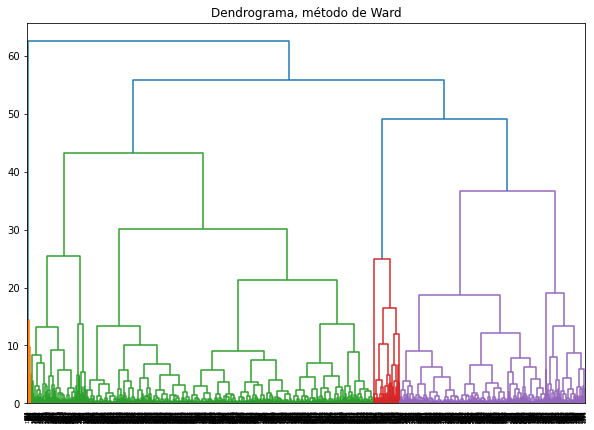

In [14]:
import scipy.cluster.hierarchy as shc
plt.figure(figsize=(10,7))  
plt.title("Dendrograma, método de Ward")  
dend = shc.dendrogram(shc.linkage(X, method='ward'))
#plt.savefig('Pyplot_dendrograma_ind7_Ward.png',dpi=600)

**Se elige la configuración de 4 clusters** (es la tercera configuración con el mayor valor promedio de silueta, pero presenta un agrupamiento adecuado en la proyección bidimensional y en el dendrograma)

In [16]:
#se obtienen las etiquetas predichas por Ward para la configuración con el mayor
#valor promedio del silhouete score (n=5)
num_clusters_ind7 = 5
clusterer_K = AgglomerativeClustering(n_clusters=num_clusters_ind7, affinity='euclidean', linkage='ward')
clusterer_K_labels = clusterer_K.fit_predict(X)

#se obtienen las etiquetas predichas por ward
y_pred_ward = clusterer_K_labels
#se guarda el nparray en un dataframe
y_pred_ward = pd.DataFrame(y_pred_ward, columns=['Estrato'])

#se transforman las etiquetas numéricas a str
etiquetas_grupos = {0:'G0', 1:'G1', 2:'G2', 3:'G3', 4:'G4', 5:'G5'}
y_pred_ward['Estrato']=y_pred_ward['Estrato'].apply(lambda x: etiquetas_grupos[x])

#concatenamos los resultados de PCA con las etiquetas de ward
df_pca_results_ind7_ward = pd.concat([df_pca_results_ind7, y_pred_ward], axis = 1)

#se guardan los resultados en un csv
df_pca_results_ind7_ward.to_csv(r'Resultados_Mun_PCA_Ward_ind7.csv', index = None)

df_pca_results_ind7_ward

,EDO,NOMBRE_ESTADO,MUN,NOMBRE_MUNICIPIO,CP1,CP2,CP3,CP4,CP5,CP6,CP7,Estrato
0,1,AGUASCALIENTES,10,SAN FRANCISCO DE LOS ROMO,-0.290827,1.304370,-0.470542,1.249692,-0.985389,0.343395,-0.883019,G1
1,1,AGUASCALIENTES,8,SAN JOSE DE GRACIA,-0.215022,-0.976397,-0.423919,1.386989,-1.260267,-0.625396,0.304296,G2
2,1,AGUASCALIENTES,9,TEPEZALA,-0.597435,0.071978,-0.716279,1.371428,-0.870282,-0.309656,-0.647832,G1
3,1,AGUASCALIENTES,11,EL LLANO,-0.382682,-0.278937,-0.606074,1.675445,-0.996878,-0.462573,-0.289389,G2
4,1,AGUASCALIENTES,2,ASIENTOS,-0.428400,-0.232114,-0.320612,1.533638,-0.432850,-0.508456,-0.335265,G2
...,...,...,...,...,...,...,...,...,...,...,...,...
2451,32,ZACATECAS,45,TEPECHITLAN,0.336526,-0.414118,0.879856,-0.236011,-0.054547,-0.515434,0.024942,G0
2452,32,ZACATECAS,14,GENERAL FRANCISCO R. MURGUIA,-0.052455,-0.693651,2.394801,0.574858,0.201790,-0.068696,-0.577988,G0
2453,32,ZACATECAS,44,TABASCO,0.815847,0.275372,1.779525,0.018950,-0.257829,0.094995,-0.099322,G0
2454,32,ZACATECAS,9,CHALCHIHUITES,0.562309,0.233027,0.954854,-0.056961,-0.390447,-0.419723,-0.098396,G0


### Análisis de silueta, dendograma y configuración óptima de grupos con complete linkage

Cálculo de los silhouette_scores para diferentes números de clusters en complete linkage

For n_clusters = 2 The average silhouette_score is : 0.7427739664649179
For n_clusters = 3 The average silhouette_score is : 0.4489718251589875
For n_clusters = 4 The average silhouette_score is : 0.44635344146353956
For n_clusters = 5 The average silhouette_score is : 0.44323842615769177
For n_clusters = 6 The average silhouette_score is : 0.3761542262111524
For n_clusters = 7 The average silhouette_score is : 0.39650348186741535


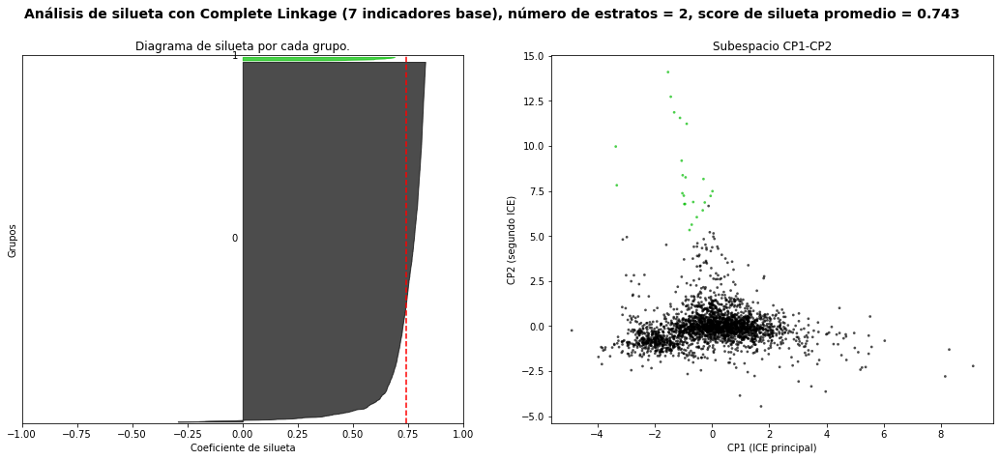

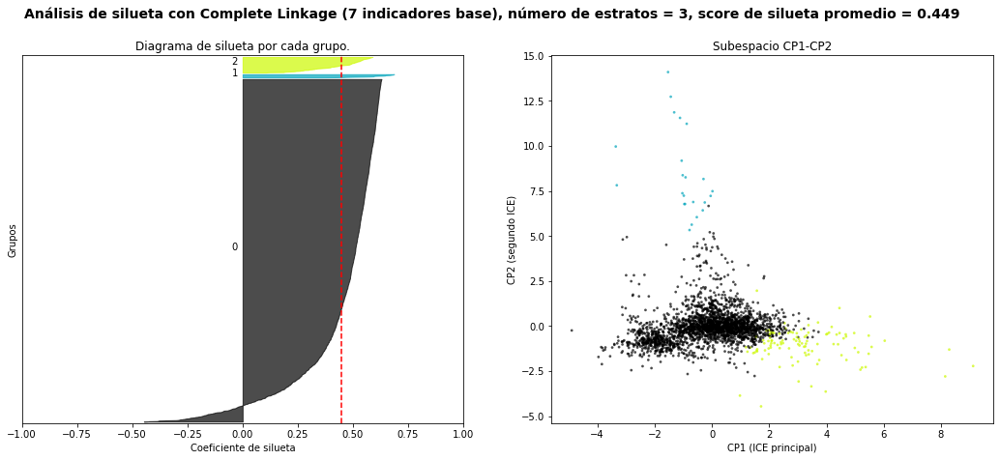

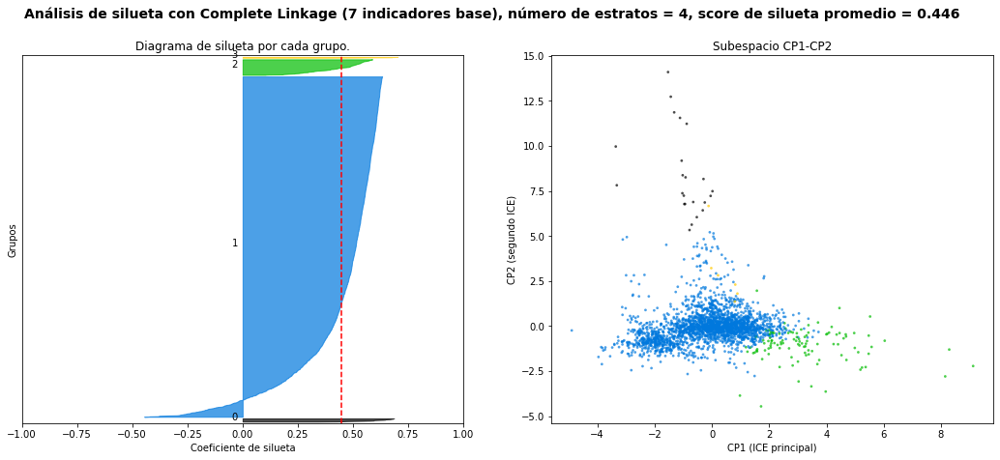

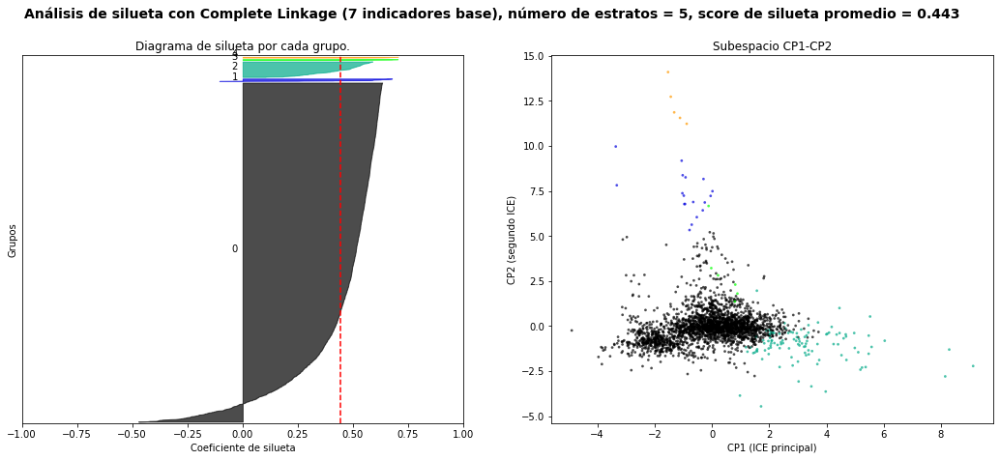

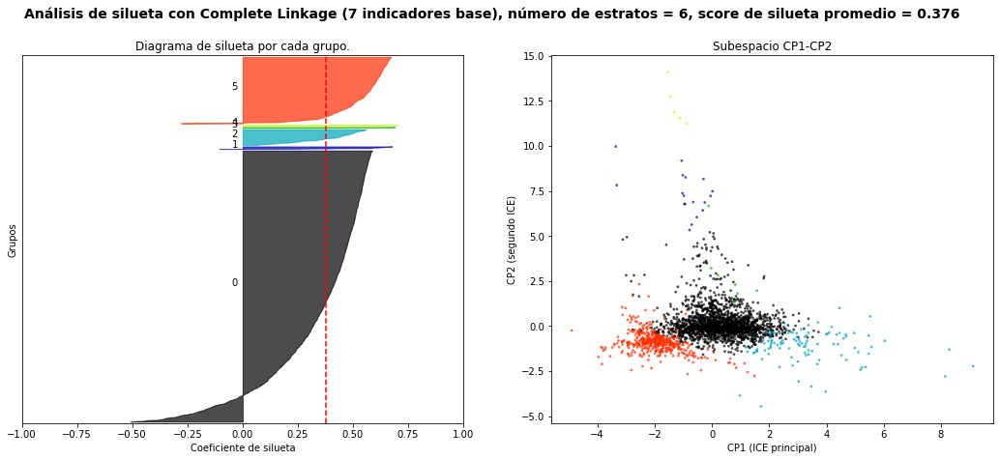

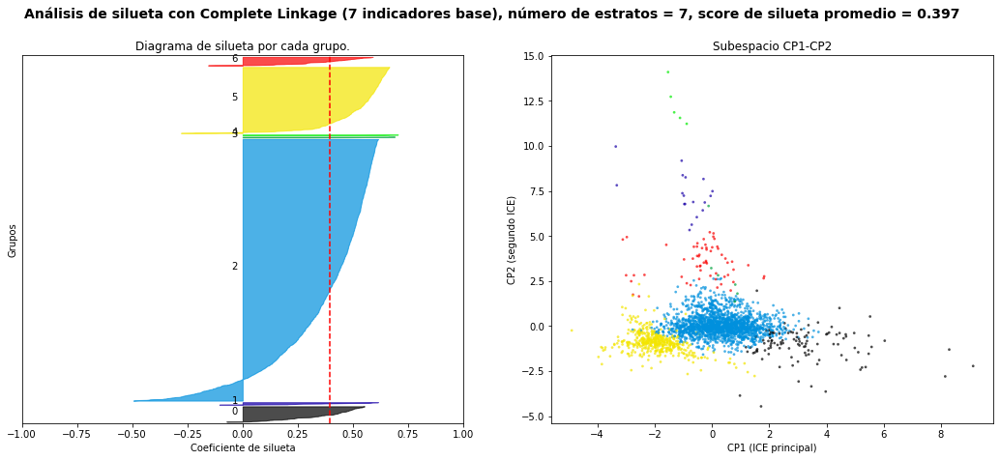

In [16]:
from sklearn.cluster import AgglomerativeClustering
from sklearn.metrics import silhouette_samples, silhouette_score
import matplotlib.cm as cm

#Datos en el espacio de las componentes principales
X=x_pca

#numero de clusters/grupos que serán analizados
range_n_clusters = [2, 3, 4, 5,6,7]

for n_clusters in range_n_clusters:
    # Create a subplot with 1 row and 2 columns
    fig, (ax1, ax2) = plt.subplots(1, 2)
    fig.set_size_inches(18, 7)

    # The 1st subplot is the silhouette plot
    # The silhouette coefficient can range from -1, 1 
    ax1.set_xlim([-1, 1])
    # The (n_clusters+1)*10 is for inserting blank space between silhouette
    # plots of individual clusters, to demarcate them clearly.
    ax1.set_ylim([0, len(X) + (n_clusters + 1) * 10])

    # Initialize the clusterer with n_clusters value and a random generator
    # seed of 0 for reproducibility.
    clusterer = AgglomerativeClustering(
        n_clusters=n_clusters, linkage='complete')
    cluster_labels = clusterer.fit_predict(X)

    # The silhouette_score gives the average value for all the samples.
    # This gives a perspective into the density and separation of the formed clusters
    silhouette_avg = silhouette_score(X, cluster_labels)
    print("For n_clusters =", n_clusters,
          "The average silhouette_score is :", silhouette_avg)

    # Compute the silhouette scores for each sample
    sample_silhouette_values = silhouette_samples(X, cluster_labels)

    y_lower = 10
    for i in range(n_clusters):
        # Aggregate the silhouette scores for samples belonging to
        # cluster i, and sort them
        ith_cluster_silhouette_values = \
            sample_silhouette_values[cluster_labels == i]

        ith_cluster_silhouette_values.sort()

        size_cluster_i = ith_cluster_silhouette_values.shape[0]
        y_upper = y_lower + size_cluster_i

        color = cm.nipy_spectral(float(i) / n_clusters)
        ax1.fill_betweenx(np.arange(y_lower, y_upper),
                          0, ith_cluster_silhouette_values,
                          facecolor=color, edgecolor=color, alpha=0.7)

        # Label the silhouette plots with their cluster numbers at the middle
        ax1.text(-0.05, y_lower + 0.5 * size_cluster_i, str(i))

        # Compute the new y_lower for next plot
        y_lower = y_upper + 10  # 10 for the 0 samples

    ax1.set_title("Diagrama de silueta por cada grupo.")
    ax1.set_xlabel("Coeficiente de silueta")
    ax1.set_ylabel("Grupos")

    # The vertical line for average silhouette score of all the values
    ax1.axvline(x=silhouette_avg, color="red", linestyle="--")

    ax1.set_yticks([])  # Clear the yaxis labels / ticks

    # 2nd Plot showing the actual clusters formed
    colors = cm.nipy_spectral(cluster_labels.astype(float) / n_clusters)
    ax2.scatter(X[:, 0], X[:, 1], marker='.', s=30, lw=0, alpha=0.7,
                c=colors, edgecolor='k')

    ax2.set_title("Subespacio CP1-CP2")
    ax2.set_xlabel("CP1 (ICE principal)")
    ax2.set_ylabel("CP2 (segundo ICE)")

    plt.suptitle(("Análisis de silueta con Complete Linkage (7 indicadores base), "
                  "número de estratos = %d, " % n_clusters +
                 "score de silueta promedio = %1.3f" % silhouette_avg),
                 fontsize=14, fontweight='bold')
    #plt.savefig('Pyplot_silhouette_score_ind7_complete_'+str(n_clusters)+'.png',dpi=600)

Dendrograma

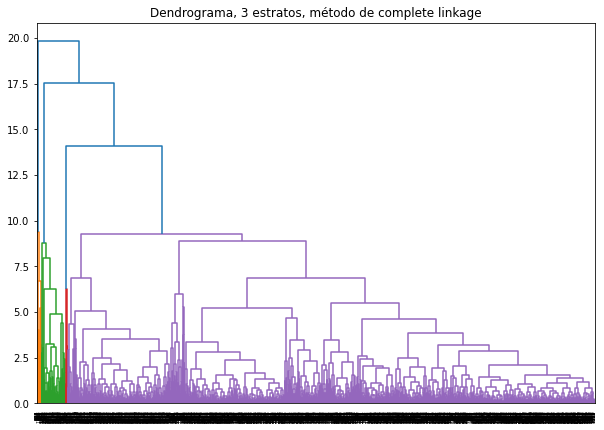

In [17]:
import scipy.cluster.hierarchy as shc
plt.figure(figsize=(10,7))  
plt.title("Dendrograma, 3 estratos, método de complete linkage")  
dend = shc.dendrogram(shc.linkage(X, method='complete'))
#plt.savefig('Pyplot_dendrograma_ind7_complete.png',dpi=600)

**Se elige la configuración de 3 clusters** 

In [18]:
#se obtienen las etiquetas predichas por Ward para la configuración con el mayor
#valor promedio del silhouete score (n=5)
num_clusters_ind7 = 3
clusterer_K = AgglomerativeClustering(n_clusters=num_clusters_ind7, affinity='euclidean', linkage='complete')
clusterer_K_labels = clusterer_K.fit_predict(X)

#se obtienen las etiquetas predichas por ward
y_pred_ward = clusterer_K_labels
#se guarda el nparray en un dataframe
y_pred_ward = pd.DataFrame(y_pred_ward, columns=['Estrato'])

#se transforman las etiquetas numéricas a str
etiquetas_grupos = {0:'G0', 1:'G1', 2:'G2'}
y_pred_ward['Estrato']=y_pred_ward['Estrato'].apply(lambda x: etiquetas_grupos[x])

#concatenamos los resultados de PCA con las etiquetas de ward
df_pca_results_ind7_complete = pd.concat([df_pca_results_ind7, y_pred_ward], axis = 1)

#se guardan los resultados en un csv
df_pca_results_ind7_complete.to_csv(r'Resultados_Mun_PCA_complete_ind7.csv', index = None)

df_pca_results_ind7_complete

,EDO,NOMBRE_ESTADO,MUN,NOMBRE_MUNICIPIO,CP1,CP2,CP3,CP4,CP5,CP6,CP7,Estrato
0,1,AGUASCALIENTES,10,SAN FRANCISCO DE LOS ROMO,-1.061899,0.788043,-0.837586,-0.614461,-0.088128,-0.782747,-0.238578,G0
1,1,AGUASCALIENTES,8,SAN JOSE DE GRACIA,-3.242619,-1.163180,-0.391435,0.193575,0.880911,0.128676,-1.012632,G0
2,1,AGUASCALIENTES,9,TEPEZALA,-2.714649,-0.207140,-0.939179,0.184211,0.615393,-0.770295,-0.744057,G0
3,1,AGUASCALIENTES,11,EL LLANO,-2.489077,-0.324405,-0.411126,-0.029804,0.468563,-0.389211,-0.141379,G0
4,1,AGUASCALIENTES,2,ASIENTOS,-2.499466,-0.395191,-0.509621,0.718468,0.620966,-0.484175,-0.511286,G0
...,...,...,...,...,...,...,...,...,...,...,...,...
2453,32,ZACATECAS,45,TEPECHITLAN,0.548172,-0.308683,0.679952,0.209243,-0.452260,0.088731,-0.062292,G0
2454,32,ZACATECAS,14,GENERAL FRANCISCO R. MURGUIA,0.875699,0.306366,1.949664,0.996421,0.061302,-0.572234,-0.267121,G0
2455,32,ZACATECAS,44,TABASCO,1.864008,-0.162682,0.715202,0.470561,0.292022,-0.127472,-0.194333,G0
2456,32,ZACATECAS,9,CHALCHIHUITES,0.886651,-0.151959,0.337662,0.033250,-0.481215,-0.003173,-0.078652,G0


### Análisis de silueta, dendograma y configuración óptima de grupos con average linkage

Cálculo de los silhouette_scores para diferentes números de clusters en average linkage

For n_clusters = 2 The average silhouette_score is : 0.7427739664649179
For n_clusters = 3 The average silhouette_score is : 0.7136632889400808
For n_clusters = 4 The average silhouette_score is : 0.6454909112785183
For n_clusters = 5 The average silhouette_score is : 0.6106028022406746
For n_clusters = 6 The average silhouette_score is : 0.5253221845133971
For n_clusters = 7 The average silhouette_score is : 0.5220856618240213


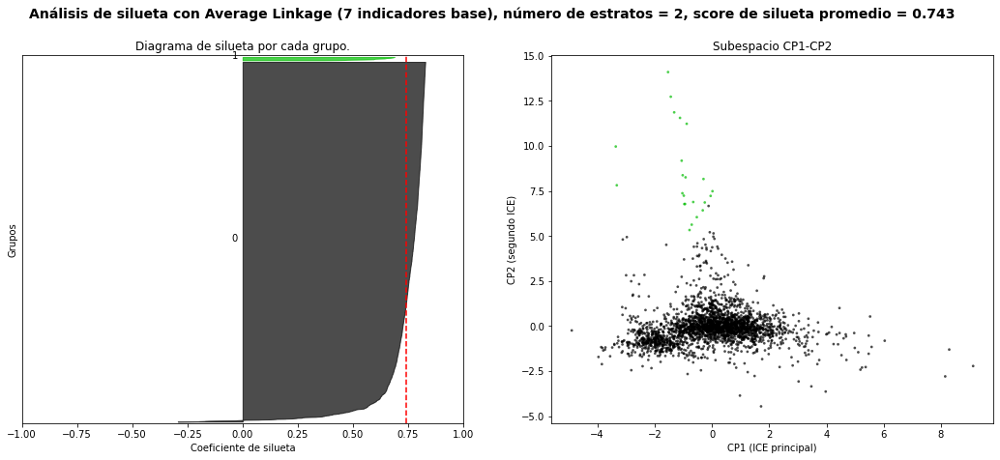

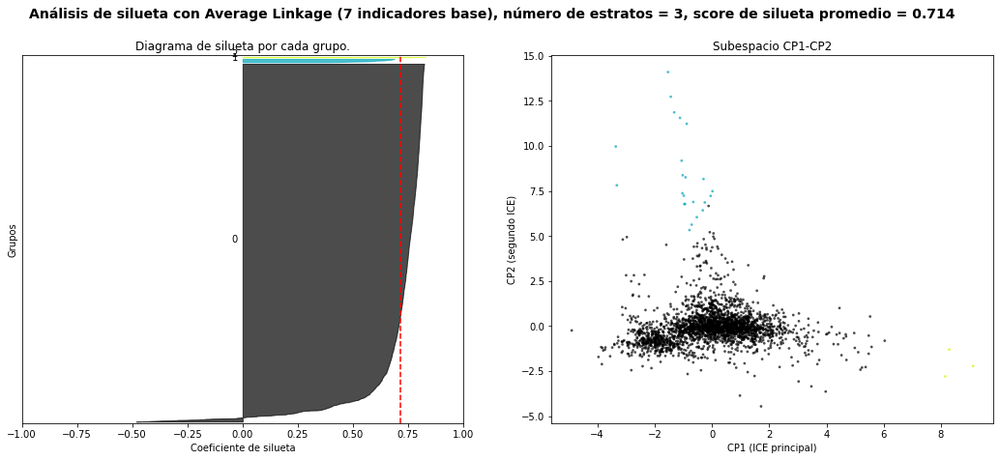

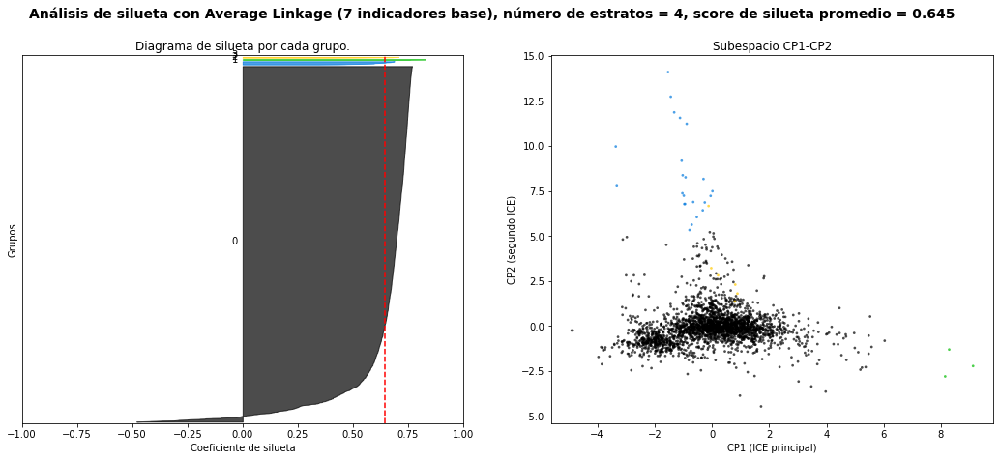

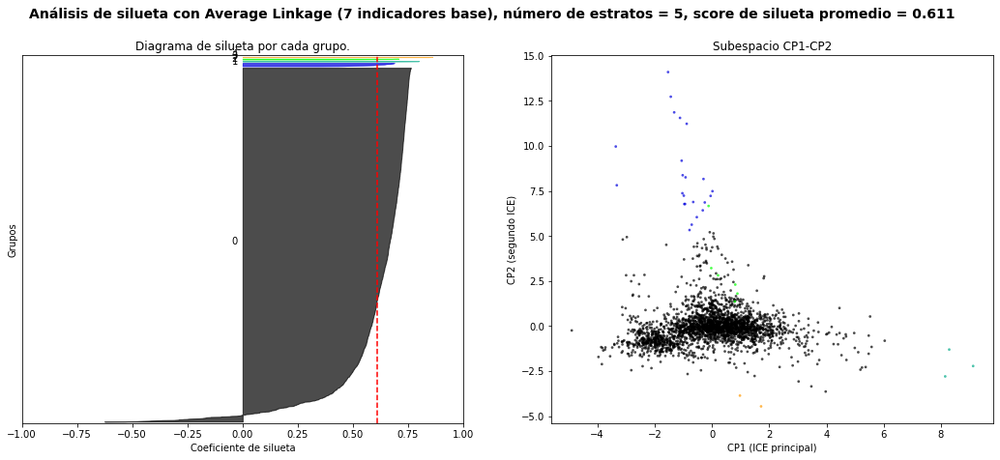

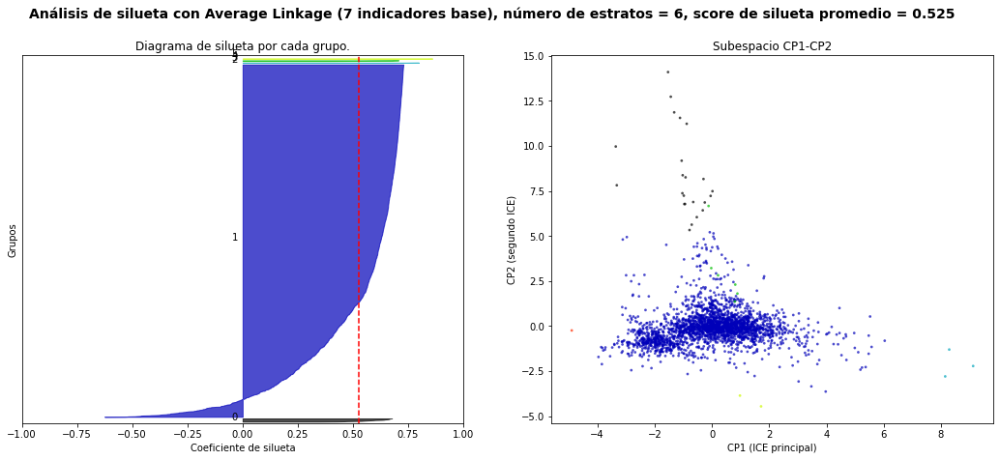

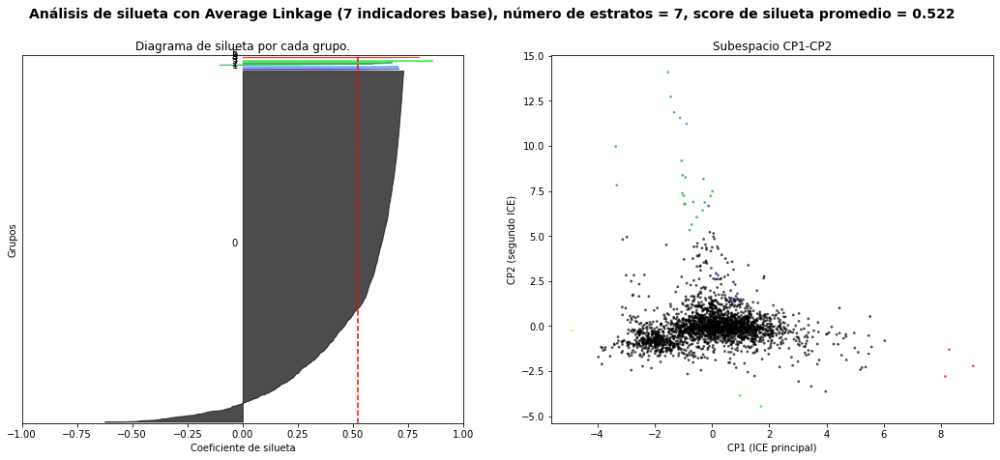

In [19]:
from sklearn.cluster import AgglomerativeClustering
from sklearn.metrics import silhouette_samples, silhouette_score
import matplotlib.cm as cm

#Datos en el espacio de las componentes principales
X=x_pca

#numero de clusters/grupos que serán analizados
range_n_clusters = [2, 3, 4, 5,6,7]

for n_clusters in range_n_clusters:
    # Create a subplot with 1 row and 2 columns
    fig, (ax1, ax2) = plt.subplots(1, 2)
    fig.set_size_inches(18, 7)

    # The 1st subplot is the silhouette plot
    # The silhouette coefficient can range from -1, 1 
    ax1.set_xlim([-1, 1])
    # The (n_clusters+1)*10 is for inserting blank space between silhouette
    # plots of individual clusters, to demarcate them clearly.
    ax1.set_ylim([0, len(X) + (n_clusters + 1) * 10])

    # Initialize the clusterer with n_clusters value and a random generator
    # seed of 0 for reproducibility.
    clusterer = AgglomerativeClustering(
        n_clusters=n_clusters, linkage='average')
    cluster_labels = clusterer.fit_predict(X)

    # The silhouette_score gives the average value for all the samples.
    # This gives a perspective into the density and separation of the formed clusters
    silhouette_avg = silhouette_score(X, cluster_labels)
    print("For n_clusters =", n_clusters,
          "The average silhouette_score is :", silhouette_avg)

    # Compute the silhouette scores for each sample
    sample_silhouette_values = silhouette_samples(X, cluster_labels)

    y_lower = 10
    for i in range(n_clusters):
        # Aggregate the silhouette scores for samples belonging to
        # cluster i, and sort them
        ith_cluster_silhouette_values = \
            sample_silhouette_values[cluster_labels == i]

        ith_cluster_silhouette_values.sort()

        size_cluster_i = ith_cluster_silhouette_values.shape[0]
        y_upper = y_lower + size_cluster_i

        color = cm.nipy_spectral(float(i) / n_clusters)
        ax1.fill_betweenx(np.arange(y_lower, y_upper),
                          0, ith_cluster_silhouette_values,
                          facecolor=color, edgecolor=color, alpha=0.7)

        # Label the silhouette plots with their cluster numbers at the middle
        ax1.text(-0.05, y_lower + 0.5 * size_cluster_i, str(i))

        # Compute the new y_lower for next plot
        y_lower = y_upper + 10  # 10 for the 0 samples

    ax1.set_title("Diagrama de silueta por cada grupo.")
    ax1.set_xlabel("Coeficiente de silueta")
    ax1.set_ylabel("Grupos")

    # The vertical line for average silhouette score of all the values
    ax1.axvline(x=silhouette_avg, color="red", linestyle="--")

    ax1.set_yticks([])  # Clear the yaxis labels / ticks

    # 2nd Plot showing the actual clusters formed
    colors = cm.nipy_spectral(cluster_labels.astype(float) / n_clusters)
    ax2.scatter(X[:, 0], X[:, 1], marker='.', s=30, lw=0, alpha=0.7,
                c=colors, edgecolor='k')

    ax2.set_title("Subespacio CP1-CP2")
    ax2.set_xlabel("CP1 (ICE principal)")
    ax2.set_ylabel("CP2 (segundo ICE)")

    plt.suptitle(("Análisis de silueta con Average Linkage (7 indicadores base), "
                  "número de estratos = %d, " % n_clusters +
                 "score de silueta promedio = %1.3f" % silhouette_avg),
                 fontsize=14, fontweight='bold')
    #plt.savefig('Pyplot_silhouette_score_ind7_average_'+str(n_clusters)+'.png',dpi=600)

Dendrograma

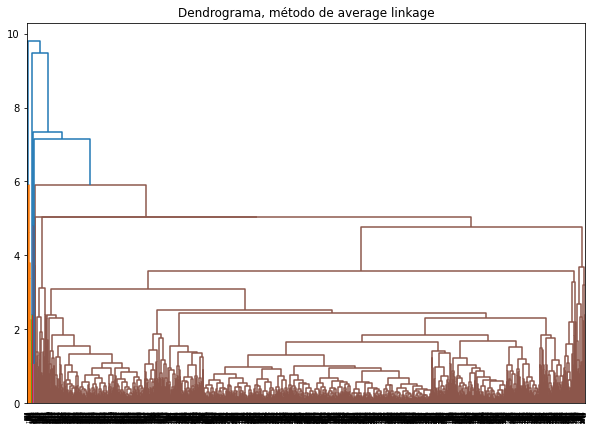

In [20]:
import scipy.cluster.hierarchy as shc
plt.figure(figsize=(10,7))  
plt.title("Dendrograma, método de average linkage")  
dend = shc.dendrogram(shc.linkage(X, method='average'))
#plt.savefig('Pyplot_dendrograma_ind7_average.png',dpi=600)

### Análisis de silueta, dendograma y configuración óptima de grupos con single linkage

Cálculo de los silhouette_scores para diferentes números de clusters en single linkage

For n_clusters = 2 The average silhouette_score is : 0.7479028873045614
For n_clusters = 3 The average silhouette_score is : 0.7077506062167823
For n_clusters = 4 The average silhouette_score is : 0.6288977274847589
For n_clusters = 5 The average silhouette_score is : 0.6200655258181543
For n_clusters = 6 The average silhouette_score is : 0.6256720086125872
For n_clusters = 7 The average silhouette_score is : 0.5759449091297045


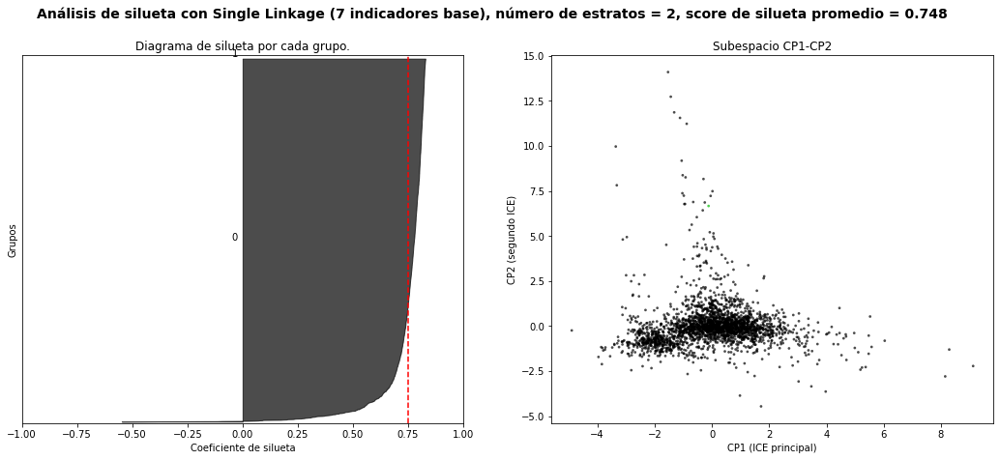

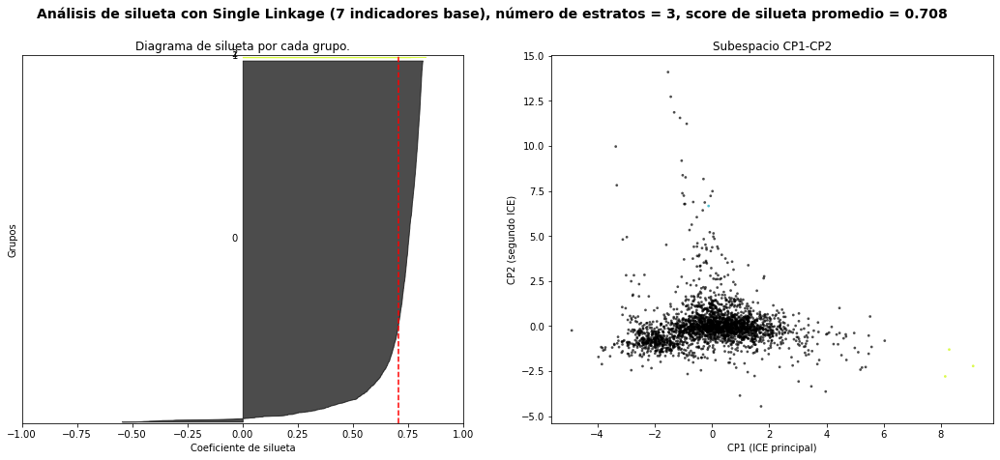

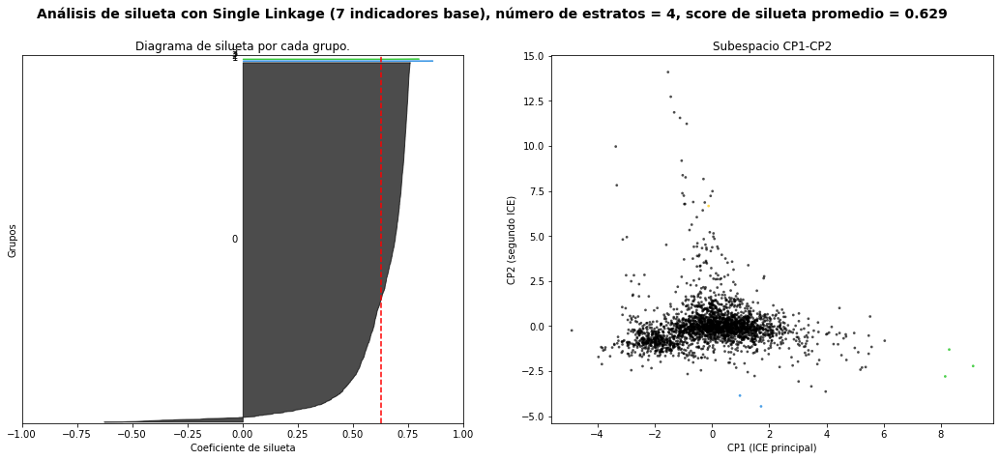

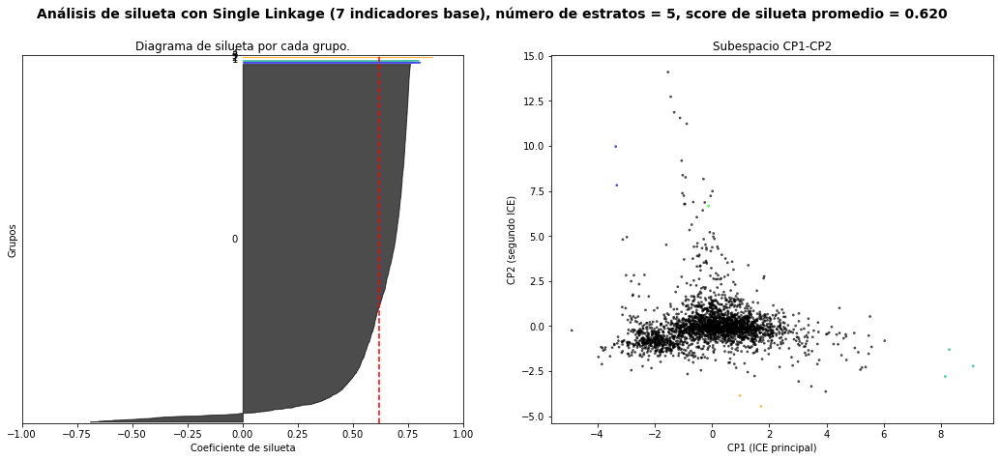

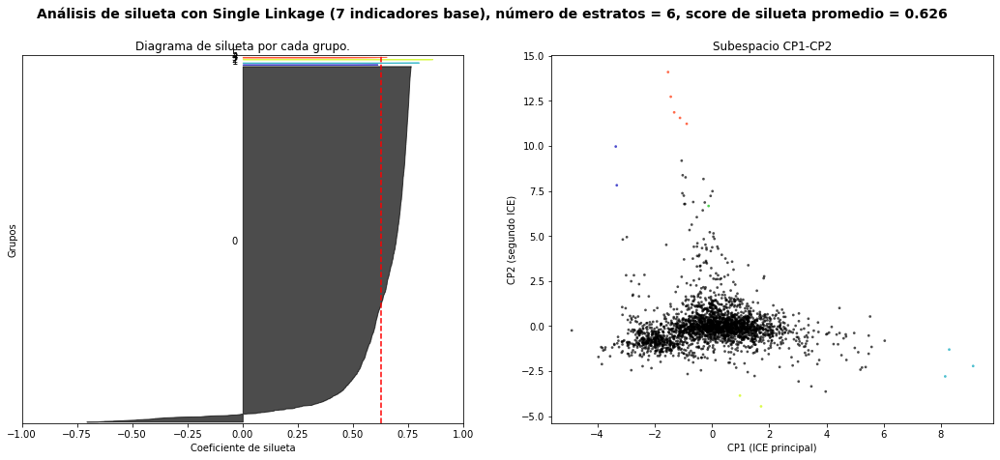

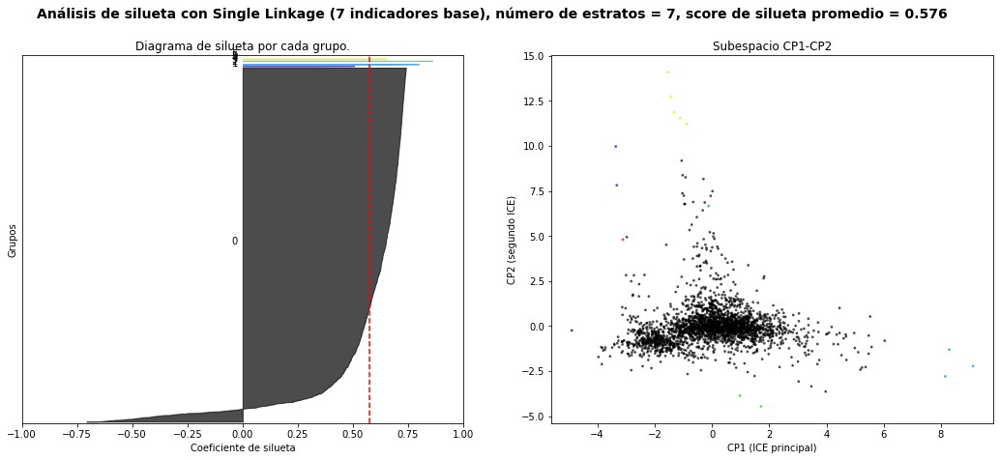

In [21]:
from sklearn.cluster import AgglomerativeClustering
from sklearn.metrics import silhouette_samples, silhouette_score
import matplotlib.cm as cm

#Datos en el espacio de las componentes principales
X=x_pca

#numero de clusters/grupos que serán analizados
range_n_clusters = [2, 3, 4, 5,6,7]

for n_clusters in range_n_clusters:
    # Create a subplot with 1 row and 2 columns
    fig, (ax1, ax2) = plt.subplots(1, 2)
    fig.set_size_inches(18, 7)

    # The 1st subplot is the silhouette plot
    # The silhouette coefficient can range from -1, 1 
    ax1.set_xlim([-1, 1])
    # The (n_clusters+1)*10 is for inserting blank space between silhouette
    # plots of individual clusters, to demarcate them clearly.
    ax1.set_ylim([0, len(X) + (n_clusters + 1) * 10])

    # Initialize the clusterer with n_clusters value and a random generator
    # seed of 0 for reproducibility.
    clusterer = AgglomerativeClustering(
        n_clusters=n_clusters, linkage='single')
    cluster_labels = clusterer.fit_predict(X)

    # The silhouette_score gives the average value for all the samples.
    # This gives a perspective into the density and separation of the formed clusters
    silhouette_avg = silhouette_score(X, cluster_labels)
    print("For n_clusters =", n_clusters,
          "The average silhouette_score is :", silhouette_avg)

    # Compute the silhouette scores for each sample
    sample_silhouette_values = silhouette_samples(X, cluster_labels)

    y_lower = 10
    for i in range(n_clusters):
        # Aggregate the silhouette scores for samples belonging to
        # cluster i, and sort them
        ith_cluster_silhouette_values = \
            sample_silhouette_values[cluster_labels == i]

        ith_cluster_silhouette_values.sort()

        size_cluster_i = ith_cluster_silhouette_values.shape[0]
        y_upper = y_lower + size_cluster_i

        color = cm.nipy_spectral(float(i) / n_clusters)
        ax1.fill_betweenx(np.arange(y_lower, y_upper),
                          0, ith_cluster_silhouette_values,
                          facecolor=color, edgecolor=color, alpha=0.7)

        # Label the silhouette plots with their cluster numbers at the middle
        ax1.text(-0.05, y_lower + 0.5 * size_cluster_i, str(i))

        # Compute the new y_lower for next plot
        y_lower = y_upper + 10  # 10 for the 0 samples

    ax1.set_title("Diagrama de silueta por cada grupo.")
    ax1.set_xlabel("Coeficiente de silueta")
    ax1.set_ylabel("Grupos")

    # The vertical line for average silhouette score of all the values
    ax1.axvline(x=silhouette_avg, color="red", linestyle="--")

    ax1.set_yticks([])  # Clear the yaxis labels / ticks

    # 2nd Plot showing the actual clusters formed
    colors = cm.nipy_spectral(cluster_labels.astype(float) / n_clusters)
    ax2.scatter(X[:, 0], X[:, 1], marker='.', s=30, lw=0, alpha=0.7,
                c=colors, edgecolor='k')

    ax2.set_title("Subespacio CP1-CP2")
    ax2.set_xlabel("CP1 (ICE principal)")
    ax2.set_ylabel("CP2 (segundo ICE)")

    plt.suptitle(("Análisis de silueta con Single Linkage (7 indicadores base), "
                  "número de estratos = %d, " % n_clusters +
                 "score de silueta promedio = %1.3f" % silhouette_avg),
                 fontsize=14, fontweight='bold')
    #plt.savefig('Pyplot_silhouette_score_ind7_single_'+str(n_clusters)+'.png',dpi=600)

Dendrograma

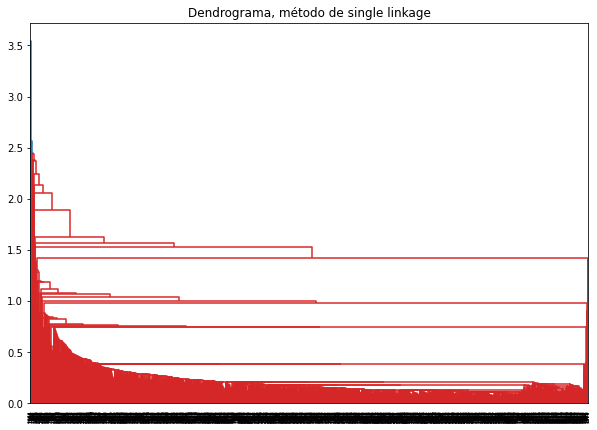

In [22]:
import scipy.cluster.hierarchy as shc
plt.figure(figsize=(10,7))  
plt.title("Dendrograma, método de single linkage")  
dend = shc.dendrogram(shc.linkage(X, method='single'))
#plt.savefig('Pyplot_dendrograma_ind7_single.png',dpi=600)

<br>

# Escenario 1: Estratificacion con Ward (4 clusters, 3 CP, 7 indicadores)

Se utiliza la última iteración guardada de Ward para asegurar la reproducibilidad de los resultados

In [17]:
df_pca_results_ind7_ward.head()

,EDO,NOMBRE_ESTADO,MUN,NOMBRE_MUNICIPIO,CP1,CP2,CP3,CP4,CP5,CP6,CP7,Estrato
0,1,AGUASCALIENTES,10,SAN FRANCISCO DE LOS ROMO,-0.290827,1.304370,-0.470542,1.249692,-0.985389,0.343395,-0.883019,G1
1,1,AGUASCALIENTES,8,SAN JOSE DE GRACIA,-0.215022,-0.976397,-0.423919,1.386989,-1.260267,-0.625396,0.304296,G2
2,1,AGUASCALIENTES,9,TEPEZALA,-0.597435,0.071978,-0.716279,1.371428,-0.870282,-0.309656,-0.647832,G1
3,1,AGUASCALIENTES,11,EL LLANO,-0.382682,-0.278937,-0.606074,1.675445,-0.996878,-0.462573,-0.289389,G2
4,1,AGUASCALIENTES,2,ASIENTOS,-0.428400,-0.232114,-0.320612,1.533638,-0.432850,-0.508456,-0.335265,G2


Gráfica en el espacio CP1, CP2

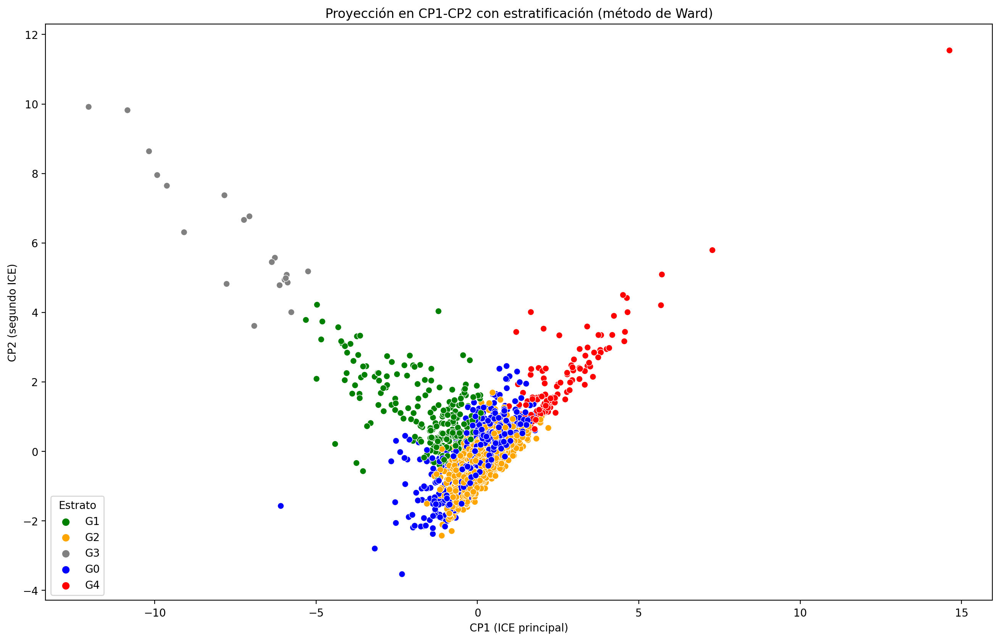

In [18]:
#Scatter plot (seaborn) CP1 vs CP2 (con clustering k-means)

plt.figure(figsize=(16, 10), dpi= 200, facecolor='w', edgecolor='k')
sns.scatterplot(x="CP1", y="CP2", 
                data=df_pca_results_ind7_ward, 
                hue="Estrato",
                palette=color_dict)
# Set x-axis label
plt.xlabel('CP1 (ICE principal)')
# Set y-axis label
plt.ylabel('CP2 (segundo ICE)')
plt.title('Proyección en CP1-CP2 con estratificación (método de Ward)')

#plt.savefig('Pyplot_PCA_Ward_ind7.png',dpi=600)

Gráfica en el espacio CP1, CP2, CP3

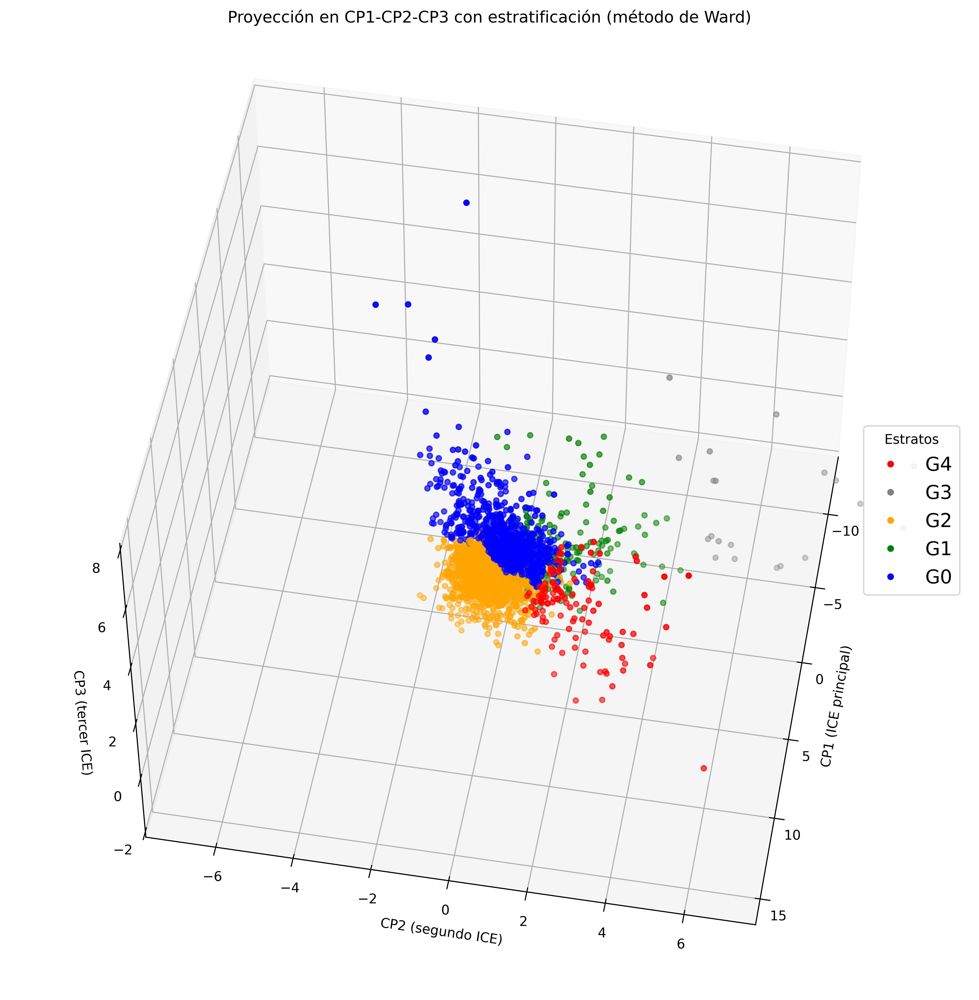

In [19]:
from matplotlib import pyplot
from mpl_toolkits.mplot3d import Axes3D
from matplotlib.lines import Line2D

#para definir los colores
colores = df_pca_results_ind7_ward['Estrato'].apply(lambda x: color_dict[x])

#figura
fig = pyplot.figure(figsize=(16, 10), dpi=600, facecolor='w', edgecolor='k')
ax = Axes3D(fig)
ax.scatter(df_pca_results_ind7_ward['CP1'], df_pca_results_ind7_ward['CP2'], df_pca_results_ind7_ward['CP3'], c=colores,s=15)
# ax.set_xlim3d(-10, 40)
ax.set_ylim3d(-7.5,7.5)
ax.set_zlim3d(-2,8)
ax.set_xlabel('CP1 (ICE principal)')
ax.set_ylabel('CP2 (segundo ICE)')
ax.set_zlabel('CP3 (tercer ICE)')
ax.view_init(elev, azim)
ax.legend(title='Estratos', handles=legend_elements_5, loc='center right',fontsize='x-large')
ax.set_title('Proyección en CP1-CP2-CP3 con estratificación (método de Ward)')

#plt.savefig('Pyplot_PCA_3d_Ward_ind7.png',dpi=600)
pyplot.show()

Gráfica 3d animada

In [20]:
#3-d plot con plotly
fig = px.scatter_3d(df_pca_results_ind7_ward, x='CP1', y='CP2', z='CP3',
              color='Estrato',
                    color_discrete_map={
                  'G0':'blue',
                  'G1':'green',
                  'G2': 'orange',
                  'G3': 'grey',
                  'G4': 'red',
                  'G5': 'magenta'})
fig.update_traces(mode='markers', marker_line_width=1, marker_size=3)
fig.update_layout(scene = dict(
                    xaxis_title='CP1 (ICE principal)',
                    yaxis_title='CP2 (segundo ICE)',
                    zaxis_title='CP3 (tercer ICE)'),
                 legend_orientation="h")
fig.show()

<br>

# Análisis estadístico de los ICE y la estratificacion


## Escenario 1: Ward

In [21]:
#unimos los resultados de PCA_ward con los metadatos y los 7 indicadores de los municipios
df_indi_pca_ward_ind7=pd.merge(datos_mun_limpio, df_pca_results_ind7_ward, on=['EDO','NOMBRE_ESTADO','MUN','NOMBRE_MUNICIPIO'], how='inner')

#renombramos algunas columnas_pca
df_indi_pca_ward_ind7=df_indi_pca_ward_ind7.rename(columns={"CP1": "CP1 (ICE principal)", "CP2": "CP2 (segundo ICE)", "CP3": "CP3 (tercer ICE)"})

df_indi_pca_ward_ind7

,EDO,NOMBRE_ESTADO,MUN,NOMBRE_MUNICIPIO,NUM_SECC_RUR,LNE,Densidad_LNE,Razon_LNE_PE,TC_LNE_2019,Coef_Var_LNE,Var_Prop_LNE,Autocorr_LNE,CP1 (ICE principal),CP2 (segundo ICE),CP3 (tercer ICE),CP4,CP5,CP6,CP7,Estrato
0,1,AGUASCALIENTES,10,SAN FRANCISCO DE LOS ROMO,3,34917.0,3566.024547,0.989272,0.037498,0.008903,0.017733,0.970914,-0.290827,1.304370,-0.470542,1.249692,-0.985389,0.343395,-0.883019,G1
1,1,AGUASCALIENTES,8,SAN JOSE DE GRACIA,4,6914.0,46.444421,0.991803,0.000289,0.002356,0.008887,0.951687,-0.215022,-0.976397,-0.423919,1.386989,-1.260267,-0.625396,0.304296,G2
2,1,AGUASCALIENTES,9,TEPEZALA,6,15545.0,2478.675412,0.990635,0.005108,0.005070,0.011921,0.832575,-0.597435,0.071978,-0.716279,1.371428,-0.870282,-0.309656,-0.647832,G1
3,1,AGUASCALIENTES,11,EL LLANO,6,15067.0,1505.749552,0.991016,-0.003373,0.004768,0.014232,0.962703,-0.382682,-0.278937,-0.606074,1.675445,-0.996878,-0.462573,-0.289389,G2
4,1,AGUASCALIENTES,2,ASIENTOS,11,34222.0,1484.722551,0.989080,0.001874,0.004824,0.015397,0.837235,-0.428400,-0.232114,-0.320612,1.533638,-0.432850,-0.508456,-0.335265,G2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2451,32,ZACATECAS,45,TEPECHITLAN,13,6959.0,36.438707,0.983523,0.066677,0.001991,0.021905,0.577314,0.336526,-0.414118,0.879856,-0.236011,-0.054547,-0.515434,0.024942,G0
2452,32,ZACATECAS,14,GENERAL FRANCISCO R. MURGUIA,32,17372.0,14.595272,0.986450,0.082705,0.002967,0.026072,0.911464,-0.052455,-0.693651,2.394801,0.574858,0.201790,-0.068696,-0.577988,G0
2453,32,ZACATECAS,44,TABASCO,16,12527.0,53.144872,0.983221,0.100307,0.005293,0.035416,0.928948,0.815847,0.275372,1.779525,0.018950,-0.257829,0.094995,-0.099322,G0
2454,32,ZACATECAS,9,CHALCHIHUITES,10,8222.0,599.837116,0.982861,0.075052,0.003692,0.024771,0.819352,0.562309,0.233027,0.954854,-0.056961,-0.390447,-0.419723,-0.098396,G0



### Gráficas (pair-plot, box-plots, violin-plots)

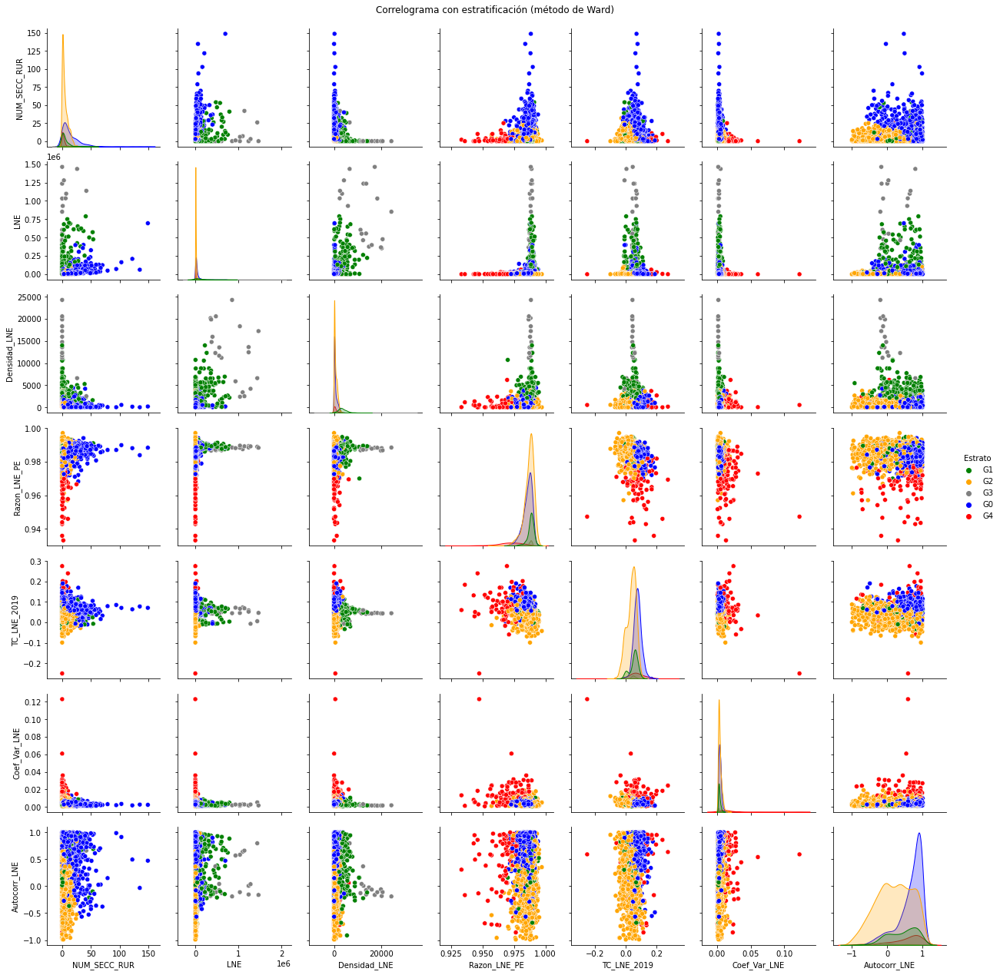

In [22]:
#sólo tomamos los indicadores y grupos
df_indi_pca_ward_ind7_f = df_indi_pca_ward_ind7[['NUM_SECC_RUR','LNE', 'Densidad_LNE', 'Razon_LNE_PE', 'TC_LNE_2019', 'Coef_Var_LNE', 'Autocorr_LNE', 'Estrato']]
#pair-plot (colores en funcion de grupo)
corr3=sns.pairplot(df_indi_pca_ward_ind7_f, 
                   hue="Estrato",
                   palette=color_dict)
corr3.fig.suptitle("Correlograma con estratificación (método de Ward)", y=1.01)

#guardar la pair-plot
corr3.savefig('Pyplot_correlogram_estratificacion_ind7.png',dpi=600)

Plotgrid de gráficas de caja para cada indicador e índice de complejidad electoral (por grupo)

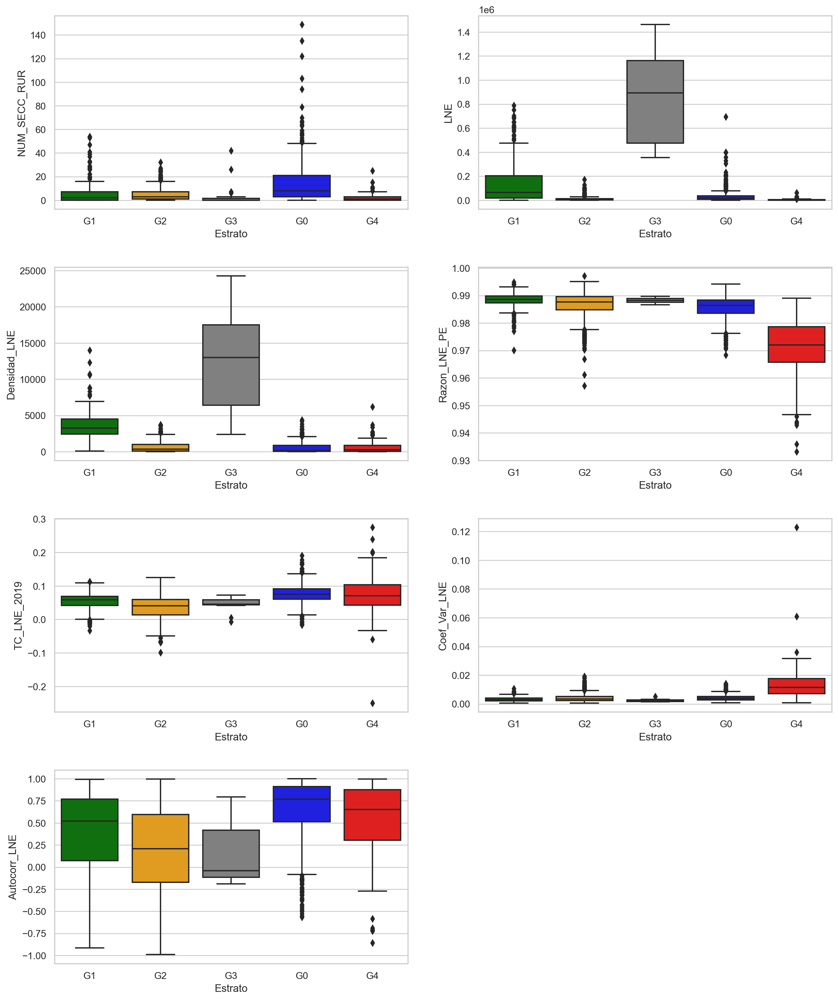

In [23]:
sns.set(style="whitegrid")
fig, axes = plt.subplots(4, 2, figsize=(16, 20), dpi= 200)

ax = sns.boxplot(x=df_indi_pca_ward_ind7["Estrato"], y=df_indi_pca_ward_ind7["NUM_SECC_RUR"], palette=color_dict, orient='v', 
    ax=axes[0, 0])
ax = sns.boxplot(x=df_indi_pca_ward_ind7["Estrato"], y=df_indi_pca_ward_ind7["LNE"], palette=color_dict, orient='v', 
    ax=axes[0, 1])
ax = sns.boxplot(x=df_indi_pca_ward_ind7["Estrato"], y=df_indi_pca_ward_ind7["Densidad_LNE"], palette=color_dict, orient='v', 
    ax=axes[1, 0])
ax = sns.boxplot(x=df_indi_pca_ward_ind7["Estrato"], y=df_indi_pca_ward_ind7["Razon_LNE_PE"], palette=color_dict, orient='v', 
    ax=axes[1, 1])
ax = sns.boxplot(x=df_indi_pca_ward_ind7["Estrato"], y=df_indi_pca_ward_ind7["TC_LNE_2019"], palette=color_dict, orient='v', 
    ax=axes[2, 0])
ax = sns.boxplot(x=df_indi_pca_ward_ind7["Estrato"], y=df_indi_pca_ward_ind7["Coef_Var_LNE"], palette=color_dict, orient='v', 
    ax=axes[2, 1])
ax = sns.boxplot(x=df_indi_pca_ward_ind7["Estrato"], y=df_indi_pca_ward_ind7["Autocorr_LNE"], palette=color_dict, orient='v', 
    ax=axes[3, 0])

fig.delaxes(axes[3][1]) #borrar subplot sin usar
plt.subplots_adjust(hspace=0.3) #dar mas espacio vertical
#se guarda la gráfica
#plt.savefig('Pyplot_box-plots-grid_estratificacion_ind7.png',dpi=600)
plt.show()

Gráfica de violín (por grupos, para el indicador "CP1")

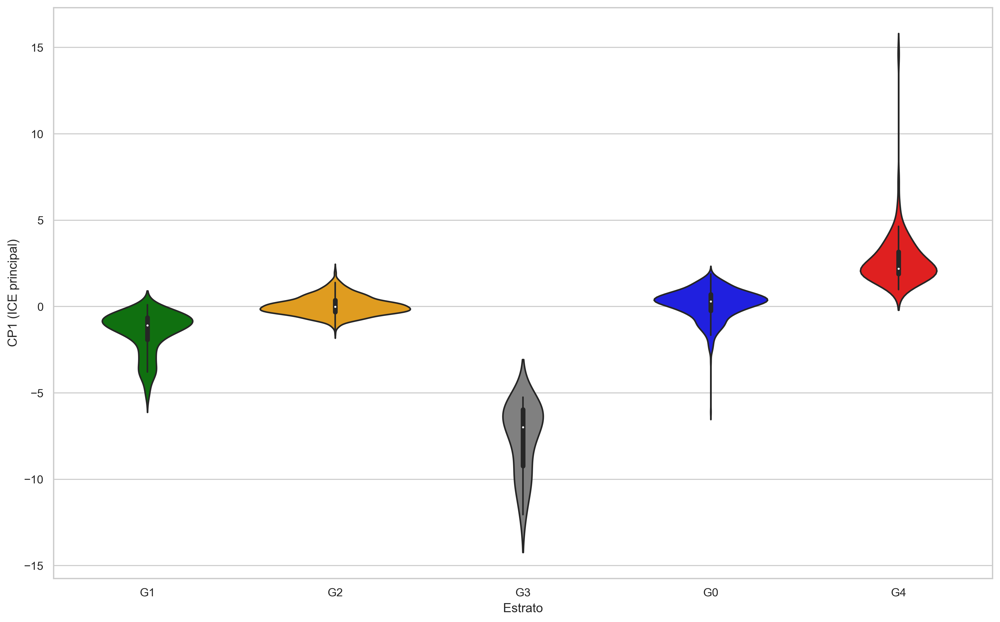

In [24]:
plt.figure(figsize=(16, 10), dpi= 300, facecolor='w', edgecolor='k')
sns.violinplot(x=df_indi_pca_ward_ind7["Estrato"], y=df_indi_pca_ward_ind7["CP1 (ICE principal)"], palette=color_dict);
#se guarda la gráfica
#plt.savefig('Pyplot_violin_estratificacion_ind7.png',dpi=600)
plt.show()

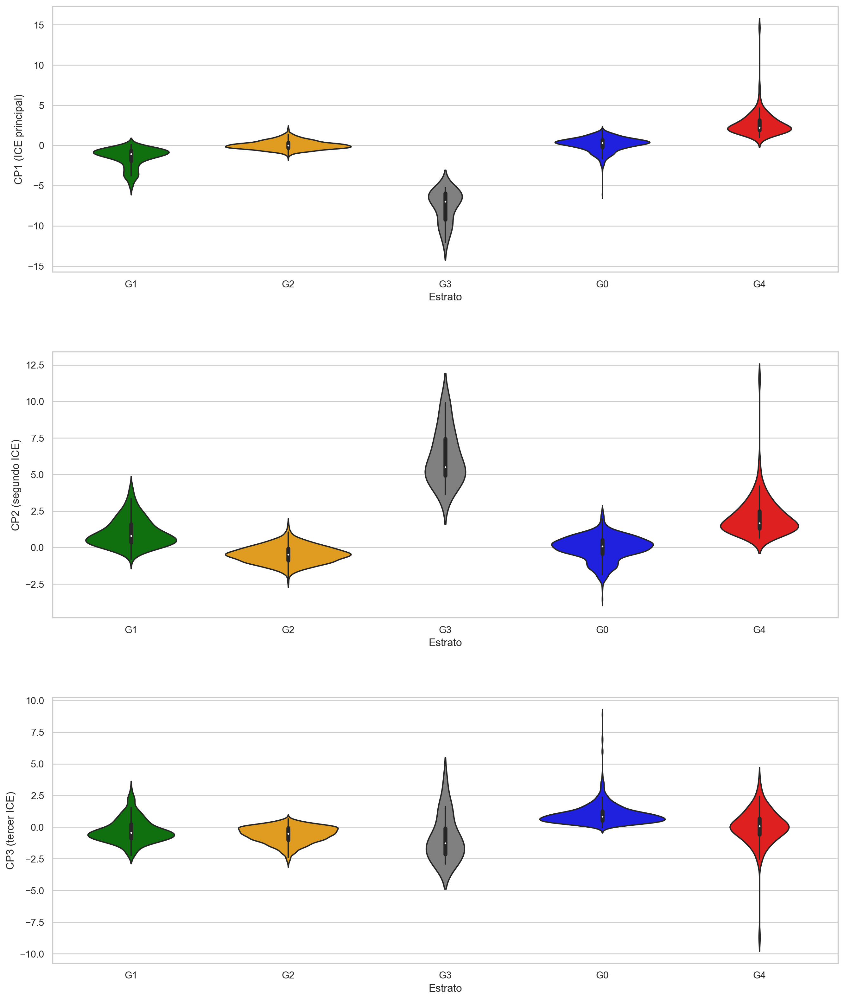

In [25]:
sns.set(style="whitegrid")

fig, axes = plt.subplots(3, 1, figsize=(16, 20), dpi= 200)
ax = sns.violinplot(x=df_indi_pca_ward_ind7["Estrato"], y=df_indi_pca_ward_ind7["CP1 (ICE principal)"], palette=color_dict, orient='v', 
    ax=axes[0])
ax = sns.violinplot(x=df_indi_pca_ward_ind7["Estrato"], y=df_indi_pca_ward_ind7["CP2 (segundo ICE)"], palette=color_dict, orient='v', 
    ax=axes[1])
ax = sns.violinplot(x=df_indi_pca_ward_ind7["Estrato"], y=df_indi_pca_ward_ind7["CP3 (tercer ICE)"], palette=color_dict, orient='v', 
    ax=axes[2])

#fig.delaxes(axes[3][1]) #borrar subplot sin usar
plt.subplots_adjust(hspace=0.3) #dar mas espacio vertical

#se guarda la gráfica
#plt.savefig('Pyplot_violin-plot-grid-CP_estratificacion_ind7.png',dpi=600)
plt.show()

Plotgrid de gráficas de violín para cada indicador e índice de complejidad electoral (por grupo)

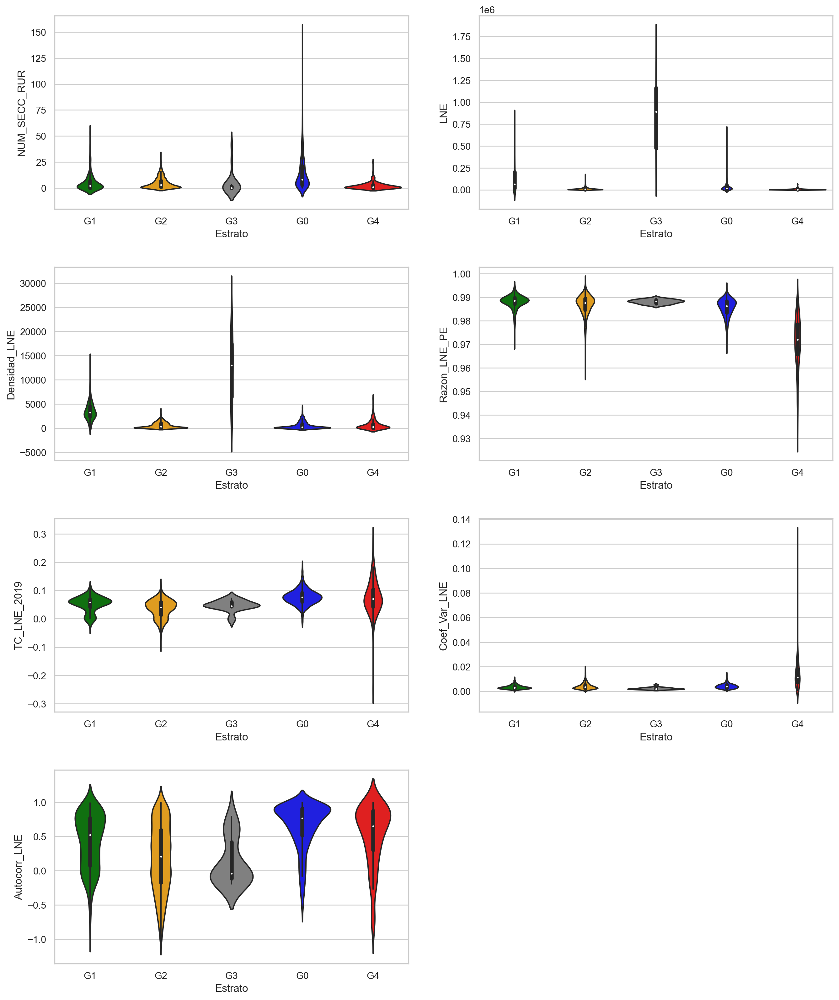

In [26]:
sns.set(style="whitegrid")

fig, axes = plt.subplots(4, 2, figsize=(16, 20), dpi= 200)
ax = sns.violinplot(x=df_indi_pca_ward_ind7["Estrato"], y=df_indi_pca_ward_ind7["NUM_SECC_RUR"], palette=color_dict, orient='v', 
    ax=axes[0, 0])
ax = sns.violinplot(x=df_indi_pca_ward_ind7["Estrato"], y=df_indi_pca_ward_ind7["LNE"], palette=color_dict, orient='v', 
    ax=axes[0, 1])
ax = sns.violinplot(x=df_indi_pca_ward_ind7["Estrato"], y=df_indi_pca_ward_ind7["Densidad_LNE"], palette=color_dict, orient='v', 
    ax=axes[1, 0])
ax = sns.violinplot(x=df_indi_pca_ward_ind7["Estrato"], y=df_indi_pca_ward_ind7["Razon_LNE_PE"], palette=color_dict, orient='v', 
    ax=axes[1, 1])
ax = sns.violinplot(x=df_indi_pca_ward_ind7["Estrato"], y=df_indi_pca_ward_ind7["TC_LNE_2019"], palette=color_dict, orient='v', 
    ax=axes[2, 0])
ax = sns.violinplot(x=df_indi_pca_ward_ind7["Estrato"], y=df_indi_pca_ward_ind7["Coef_Var_LNE"], palette=color_dict, orient='v', 
    ax=axes[2, 1])
ax = sns.violinplot(x=df_indi_pca_ward_ind7["Estrato"], y=df_indi_pca_ward_ind7["Autocorr_LNE"], palette=color_dict, orient='v', 
    ax=axes[3, 0])

fig.delaxes(axes[3][1]) #borrar subplot sin usar
plt.subplots_adjust(hspace=0.3) #dar mas espacio vertical

#se guarda la gráfica
#plt.savefig('Pyplot_violin-plot-grid_estratificacion_ind7.png',dpi=600)
plt.show()


### Identificación de los valores/municipios atípicos (7 indicadores)
Etiquetamos los municipios considerados como atípicos en los ICE (considerando la separación por grupos de la tipología, y utilizando la regla intercuartil):

In [27]:
#ejemplo:
df_indi_pca_ward_ind7['CP1 (ICE principal)'].quantile(0.25)

-0.4290536450983774

In [28]:
def IQsR_clusters(x):
    x_0 = x['Estrato'] == 'G0'
    x_g0 = x[x_0]
    Q1_g0 = x_g0['CP1 (ICE principal)'].quantile(0.25)
    Q3_g0 = x_g0['CP1 (ICE principal)'].quantile(0.75)
    IQR_pc1_g0 = Q3_g0 - Q1_g0
    Q1_pc2_g0 =  x_g0['CP2 (segundo ICE)'].quantile(0.25)
    Q3_pc2_g0 = x_g0['CP2 (segundo ICE)'].quantile(0.75)
    IQR_pc2_g0 = Q3_pc2_g0 - Q1_pc2_g0
    Q1_pc3_g0 =  x_g0['CP3 (tercer ICE)'].quantile(0.25)
    Q3_pc3_g0 = x_g0['CP3 (tercer ICE)'].quantile(0.75)
    IQR_pc3_g0 = Q3_pc3_g0 - Q1_pc3_g0
    return IQR_pc1_g0+IQR_pc1_g0;

In [29]:
IQsR_clusters(df_indi_pca_ward_ind7)

1.8897824926795055

Función para calcular el Q1, Q3 e IQR (calculado por grupos de cluster_ward), y posteriormente clasificar los municipios en tipicos o atipicos en el ICE principal.

In [30]:
def IQR_clusters(x):
    x_0 = df_indi_pca_ward_ind7['Estrato'] == 'G0'
    x_g0 = df_indi_pca_ward_ind7[x_0]
    Q1_g0 = x_g0['CP1 (ICE principal)'].quantile(0.25)
    Q3_g0 = x_g0['CP1 (ICE principal)'].quantile(0.75)
    IQR_pc1_g0 = Q3_g0 - Q1_g0
    Q1_pc2_g0 =  x_g0['CP2 (segundo ICE)'].quantile(0.25)
    Q3_pc2_g0 = x_g0['CP2 (segundo ICE)'].quantile(0.75)
    IQR_pc2_g0 = Q3_pc2_g0 - Q1_pc2_g0
    Q1_pc3_g0 =  x_g0['CP3 (tercer ICE)'].quantile(0.25)
    Q3_pc3_g0 = x_g0['CP3 (tercer ICE)'].quantile(0.75)
    IQR_pc3_g0 = Q3_pc3_g0 - Q1_pc3_g0
    
    x_1 = df_indi_pca_ward_ind7['Estrato'] == 'G1'
    x_g1 = df_indi_pca_ward_ind7[x_1]
    Q1_g1 = x_g1['CP1 (ICE principal)'].quantile(0.25)
    Q3_g1 = x_g1['CP1 (ICE principal)'].quantile(0.75)
    IQR_pc1_g1 = Q3_g1 - Q1_g1
    Q1_pc2_g1 =  x_g1['CP2 (segundo ICE)'].quantile(0.25)
    Q3_pc2_g1 = x_g1['CP2 (segundo ICE)'].quantile(0.75)
    IQR_pc2_g1 = Q3_pc2_g1 - Q1_pc2_g1
    Q1_pc3_g1 =  x_g1['CP3 (tercer ICE)'].quantile(0.25)
    Q3_pc3_g1 = x_g1['CP3 (tercer ICE)'].quantile(0.75)
    IQR_pc3_g1 = Q3_pc3_g1 - Q1_pc3_g1
    
    x_2 = df_indi_pca_ward_ind7['Estrato'] == 'G2'
    x_g2 = df_indi_pca_ward_ind7[x_2]
    Q1_g2 = x_g2['CP1 (ICE principal)'].quantile(0.25)
    Q3_g2 = x_g2['CP1 (ICE principal)'].quantile(0.75)
    IQR_pc1_g2 = Q3_g2 - Q1_g2
    Q1_pc2_g2 =  x_g2['CP2 (segundo ICE)'].quantile(0.25)
    Q3_pc2_g2 = x_g2['CP2 (segundo ICE)'].quantile(0.75)
    IQR_pc2_g2 = Q3_pc2_g2 - Q1_pc2_g2
    Q1_pc3_g2 =  x_g2['CP3 (tercer ICE)'].quantile(0.25)
    Q3_pc3_g2 = x_g2['CP3 (tercer ICE)'].quantile(0.75)
    IQR_pc3_g2 = Q3_pc3_g2 - Q1_pc3_g2
    
    x_3 = df_indi_pca_ward_ind7['Estrato'] == 'G3'
    x_g3 = df_indi_pca_ward_ind7[x_3]
    Q1_g3 = x_g3['CP1 (ICE principal)'].quantile(0.25)
    Q3_g3 = x_g3['CP1 (ICE principal)'].quantile(0.75)
    IQR_pc1_g3 = Q3_g3 - Q1_g3
    Q1_pc2_g3 =  x_g3['CP2 (segundo ICE)'].quantile(0.25)
    Q3_pc2_g3 = x_g3['CP2 (segundo ICE)'].quantile(0.75)
    IQR_pc2_g3 = Q3_pc2_g3 - Q1_pc2_g3
    Q1_pc3_g3 =  x_g3['CP3 (tercer ICE)'].quantile(0.25)
    Q3_pc3_g3 = x_g3['CP3 (tercer ICE)'].quantile(0.75)
    IQR_pc3_g3 = Q3_pc3_g3 - Q1_pc3_g3
    
    x_4 = df_indi_pca_ward_ind7['Estrato'] == 'G4'
    x_g4 = df_indi_pca_ward_ind7[x_4]
    Q1_g4 = x_g4['CP1 (ICE principal)'].quantile(0.25)
    Q3_g4 = x_g4['CP1 (ICE principal)'].quantile(0.75)
    IQR_pc1_g4 = Q3_g4 - Q1_g4
    Q1_pc2_g4 =  x_g4['CP2 (segundo ICE)'].quantile(0.25)
    Q3_pc2_g4 = x_g4['CP2 (segundo ICE)'].quantile(0.75)
    IQR_pc2_g4 = Q3_pc2_g4 - Q1_pc2_g4
    Q1_pc3_g4 =  x_g4['CP3 (tercer ICE)'].quantile(0.25)
    Q3_pc3_g4 = x_g4['CP3 (tercer ICE)'].quantile(0.75)
    IQR_pc3_g4 = Q3_pc3_g4 - Q1_pc3_g4
    
#     x_5 = df_indi_pca_ward_ind7['Estrato'] == 'G5'
#     x_g5 = df_indi_pca_ward_ind7[x_5]
#     Q1_g5 = x_g5['CP1 (ICE principal)'].quantile(0.25)
#     Q3_g5 = x_g5['CP1 (ICE principal)'].quantile(0.75)
#     IQR_pc1_g5 = Q3_g5 - Q1_g5
#     Q1_pc2_g5 =  x_g5['CP2 (segundo ICE)'].quantile(0.25)
#     Q3_pc2_g5 = x_g5['CP2 (segundo ICE)'].quantile(0.75)
#     IQR_pc2_g5 = Q3_pc2_g5 - Q1_pc2_g5
#     Q1_pc3_g5 =  x_g5['CP3 (tercer ICE)'].quantile(0.25)
#     Q3_pc3_g5 = x_g5['CP3 (tercer ICE)'].quantile(0.75)
#     IQR_pc3_g5 = Q3_pc3_g5 - Q1_pc3_g5
    
    if (x['Estrato'] == 'G0'):
        if (x['CP1 (ICE principal)'] < Q1_g0-1.5*IQR_pc1_g0) or (x['CP1 (ICE principal)'] > Q3_g0+1.5*IQR_pc1_g0):
            return 'Atípica en ICE principal'
        elif (x['CP2 (segundo ICE)'] < Q1_pc2_g0-1.5*IQR_pc2_g0) or (x['CP2 (segundo ICE)'] > Q3_pc2_g0+1.5*IQR_pc2_g0):
            return 'Atípica en segundo ICE'
        elif (x['CP3 (tercer ICE)'] < Q1_pc3_g0-1.5*IQR_pc3_g0) or (x['CP3 (tercer ICE)'] > Q3_pc3_g0+1.5*IQR_pc3_g0):
            return 'Atípica en tercer ICE'
        else:
            return 'Tipica'
    elif (x['Estrato'] == 'G1'):
        if (x['CP1 (ICE principal)'] < Q1_g1-1.5*IQR_pc1_g1) or (x['CP1 (ICE principal)'] > Q3_g1+1.5*IQR_pc1_g1):
            return 'Atípica en ICE principal'
        elif (x['CP2 (segundo ICE)'] < Q1_pc2_g1-1.5*IQR_pc2_g1) or (x['CP2 (segundo ICE)'] > Q3_pc2_g1+1.5*IQR_pc2_g1):
            return 'Atípica en segundo ICE'
        elif (x['CP3 (tercer ICE)'] < Q1_pc3_g1-1.5*IQR_pc3_g1) or (x['CP3 (tercer ICE)'] > Q3_pc3_g1+1.5*IQR_pc3_g1):
            return 'Atípica en tercer ICE'
        else:
            return 'Tipica'
    elif (x['Estrato'] == 'G2'):
        if (x['CP1 (ICE principal)'] < Q1_g2-1.5*IQR_pc1_g2) or (x['CP1 (ICE principal)'] > Q3_g2+1.5*IQR_pc1_g2):
            return 'Atípica en ICE principal'
        elif (x['CP2 (segundo ICE)'] < Q1_pc2_g2-1.5*IQR_pc2_g2) or (x['CP2 (segundo ICE)'] > Q3_pc2_g2+1.5*IQR_pc2_g2):
            return 'Atípica en segundo ICE'
        elif (x['CP3 (tercer ICE)'] < Q1_pc3_g2-1.5*IQR_pc3_g2) or (x['CP3 (tercer ICE)'] > Q3_pc3_g2+1.5*IQR_pc3_g2):
            return 'Atípica en tercer ICE'
        else:
            return 'Tipica'
    elif (x['Estrato'] == 'G3'):
        if (x['CP1 (ICE principal)'] < Q1_g3-1.5*IQR_pc1_g3) or (x['CP1 (ICE principal)'] > Q3_g3+1.5*IQR_pc1_g3):
            return 'Atípica en ICE principal'
        elif (x['CP2 (segundo ICE)'] < Q1_pc2_g3-1.5*IQR_pc2_g3) or (x['CP2 (segundo ICE)'] > Q3_pc2_g3+1.5*IQR_pc2_g3):
            return 'Atípica en segundo ICE'
        elif (x['CP3 (tercer ICE)'] < Q1_pc3_g3-1.5*IQR_pc3_g3) or (x['CP3 (tercer ICE)'] > Q3_pc3_g3+1.5*IQR_pc3_g3):
            return 'Atípica en tercer ICE'
        else:
            return 'Tipica'
    elif (x['Estrato'] == 'G4'):
        if (x['CP1 (ICE principal)'] < Q1_g4-1.5*IQR_pc1_g4) or (x['CP1 (ICE principal)'] > Q3_g4+1.5*IQR_pc1_g4):
            return 'Atípica en ICE principal'
        elif (x['CP2 (segundo ICE)'] < Q1_pc2_g4-1.5*IQR_pc2_g4) or (x['CP2 (segundo ICE)'] > Q3_pc2_g4+1.5*IQR_pc2_g4):
            return 'Atípica en segundo ICE'
        elif (x['CP3 (tercer ICE)'] < Q1_pc3_g4-1.5*IQR_pc3_g4) or (x['CP3 (tercer ICE)'] > Q3_pc3_g4+1.5*IQR_pc3_g4):
            return 'Atípica en tercer ICE'
        else:
            return 'Tipica'
#     elif (x['Estrato'] == 'G5'):
#         if (x['CP1 (ICE principal)'] < Q1_g5-1.5*IQR_pc1_g5) or (x['CP1 (ICE principal)'] > Q3_g5+1.5*IQR_pc1_g5):
#             return 'Atípica en ICE principal'
#         elif (x['CP2 (segundo ICE)'] < Q1_pc2_g5-1.5*IQR_pc2_g5) or (x['CP2 (segundo ICE)'] > Q3_pc2_g5+1.5*IQR_pc2_g5):
#             return 'Atípica en segundo ICE'
#         elif (x['CP3 (tercer ICE)'] < Q1_pc3_g5-1.5*IQR_pc3_g5) or (x['CP3 (tercer ICE)'] > Q3_pc3_g5+1.5*IQR_pc3_g5):
#             return 'Atípica en tercer ICE'
#         else:
#             return 'Tipica'
    else:
        return 'nan'

In [31]:
#se aplica la función al último df con los resultados:
df_indi_pca_ward_ind7['Atipicidad'] = df_indi_pca_ward_ind7.apply(IQR_clusters, axis = 1)

#se muestra el dataframe:
df_indi_pca_ward_ind7

,EDO,NOMBRE_ESTADO,MUN,NOMBRE_MUNICIPIO,NUM_SECC_RUR,LNE,Densidad_LNE,Razon_LNE_PE,TC_LNE_2019,Coef_Var_LNE,...,Autocorr_LNE,CP1 (ICE principal),CP2 (segundo ICE),CP3 (tercer ICE),CP4,CP5,CP6,CP7,Estrato,Atipicidad
0,1,AGUASCALIENTES,10,SAN FRANCISCO DE LOS ROMO,3,34917.0,3566.024547,0.989272,0.037498,0.008903,...,0.970914,-0.290827,1.304370,-0.470542,1.249692,-0.985389,0.343395,-0.883019,G1,Tipica
1,1,AGUASCALIENTES,8,SAN JOSE DE GRACIA,4,6914.0,46.444421,0.991803,0.000289,0.002356,...,0.951687,-0.215022,-0.976397,-0.423919,1.386989,-1.260267,-0.625396,0.304296,G2,Tipica
2,1,AGUASCALIENTES,9,TEPEZALA,6,15545.0,2478.675412,0.990635,0.005108,0.005070,...,0.832575,-0.597435,0.071978,-0.716279,1.371428,-0.870282,-0.309656,-0.647832,G1,Tipica
3,1,AGUASCALIENTES,11,EL LLANO,6,15067.0,1505.749552,0.991016,-0.003373,0.004768,...,0.962703,-0.382682,-0.278937,-0.606074,1.675445,-0.996878,-0.462573,-0.289389,G2,Tipica
4,1,AGUASCALIENTES,2,ASIENTOS,11,34222.0,1484.722551,0.989080,0.001874,0.004824,...,0.837235,-0.428400,-0.232114,-0.320612,1.533638,-0.432850,-0.508456,-0.335265,G2,Tipica
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2451,32,ZACATECAS,45,TEPECHITLAN,13,6959.0,36.438707,0.983523,0.066677,0.001991,...,0.577314,0.336526,-0.414118,0.879856,-0.236011,-0.054547,-0.515434,0.024942,G0,Tipica
2452,32,ZACATECAS,14,GENERAL FRANCISCO R. MURGUIA,32,17372.0,14.595272,0.986450,0.082705,0.002967,...,0.911464,-0.052455,-0.693651,2.394801,0.574858,0.201790,-0.068696,-0.577988,G0,Atípica en tercer ICE
2453,32,ZACATECAS,44,TABASCO,16,12527.0,53.144872,0.983221,0.100307,0.005293,...,0.928948,0.815847,0.275372,1.779525,0.018950,-0.257829,0.094995,-0.099322,G0,Tipica
2454,32,ZACATECAS,9,CHALCHIHUITES,10,8222.0,599.837116,0.982861,0.075052,0.003692,...,0.819352,0.562309,0.233027,0.954854,-0.056961,-0.390447,-0.419723,-0.098396,G0,Tipica


In [32]:
#para verificar, imprimimos los valores únicos en la columna Atipicidad.
df_indi_pca_ward_ind7.Atipicidad.unique()

array(['Tipica', 'Atípica en ICE principal', 'Atípica en tercer ICE',
       'Atípica en segundo ICE'], dtype=object)

In [35]:
#se guardan los resultados en un csv
#df_indi_pca_ward_ind7.to_csv(r'Resultados_Mun_Indic_PCA_ward_Atip_ind7.csv', index = None)

## Estadisticas

In [4]:
#resultados
df_indi_pca_ward_ind7 = pd.read_csv("E:/Google Drive/PREPRINTS_PONENCIAS/[Articulo]_Complejidad sistema geo-electoral_municipios/Code_Mun/3_Estratificacion/Resultados_Mun_Indic_PCA_ward_Atip_ind7.csv", encoding='utf-8')

In [5]:
#imprimimos la frecuencia de los valores únicos en Atipicidad
df_indi_pca_ward_ind7['Atipicidad'].value_counts()

Tipica                      2315
Atípica en ICE principal      64
Atípica en tercer ICE         45
Atípica en segundo ICE        32
Name: Atipicidad, dtype: int64

In [34]:
#imprimimos el número de municipios por grupo de la tipología.
df_indi_pca_ward_ind7['Estrato'].value_counts()

G2    1266
G0     815
G1     239
G4     116
G3      20
Name: Estrato, dtype: int64

In [6]:
#estadisticas tendencia central de los estratos
df_indi_pca_ward_ind7.groupby("Estrato")['LNE'].describe().reset_index()

,Estrato,count,mean,std,min,25%,50%,75%,max
0,G0,815.0,31832.851534,48633.809305,320.0,7511.00,16616.0,35772.00,695202.0
1,G1,239.0,140707.154812,178460.963273,327.0,16842.50,63802.0,204384.50,789602.0
2,G2,1266.0,10385.068720,13808.083953,152.0,2294.25,5892.5,13091.50,170909.0
3,G3,20.0,844279.050000,387284.987308,353944.0,474021.00,891754.0,1161875.75,1463720.0
4,G4,116.0,4418.646552,7729.344483,61.0,868.25,1854.0,4569.00,62803.0


In [46]:
#Estadisticas por estado de acuerdo a la estratificacion y al valor promedio de los ICE por estrato
apa = df_indi_pca_ward_ind7
apa['LNE_EDO'] = apa['LNE'].groupby(apa['NOMBRE_ESTADO']).transform('sum')
apa

stat_edo_estratos = apa.groupby(['NOMBRE_ESTADO','Estrato']).apply(lambda s: pd.Series({ 
    "NoMun": s["NOMBRE_MUNICIPIO"].count(), 
    "LNE_estrato": s["LNE"].sum(),
    "%LNE_estrato": s["LNE"].sum() / s["LNE_EDO"].mean(),
    "CP1_estrato": s["CP1 (ICE principal)"].mean(),
    "CP2_estrato": s["CP2 (segundo ICE)"].mean(),
    "CP3_estrato": s["CP3 (tercer ICE)"].mean(),
}))

stat_edo_estratos.reset_index().to_csv(r'Resultados_Mun_Edo-Stat_ind7.csv', index = None)
stat_edo_estratos

NoMun  LNE_estrato  %LNE_estrato  CP1_estrato  \
NOMBRE_ESTADO   Estrato                                                  
AGUASCALIENTES  G1         7.0     861734.0      0.893580    -1.458196   
                G2         4.0     102627.0      0.106420    -0.373650   
BAJA CALIFORNIA G0         1.0     399621.0      0.142334    -2.395104   
                G1         3.0     972264.0      0.346295    -2.044081   
                G3         1.0    1435734.0      0.511371    -9.091774   
...                        ...          ...           ...          ...   
YUCATAN         G2        55.0     248197.0      0.156762     0.134916   
                G4         1.0       9146.0      0.005777     1.702222   
ZACATECAS       G0        43.0     831811.0      0.713527     0.167338   
                G1         3.0     256573.0      0.220088    -0.747096   
                G2        12.0      77390.0      0.066385     0.205593   

                         CP2_estrato  CP3_estrato  
NOMBRE_ESTADO   Estrato                            
AGUASCALIENTES  G1          0.908289    -0.713954  
                G2         -0.574077    -0.346847  
BAJA CALIFORNIA G0         -0.022061     1.689324  
                G1          1.125371     0.167323  
                G3          6.306996     1.612312  
...                              ...          ...  
YUCATAN         G2         -0.174617    -0.691249  
                G4          1.504063     1.518975  
ZACATECAS       G0         -0.216018     1.367701  
                G1          0.531817     0.479643  
                G2         -0.518627    -0.236246  

[109 rows x 6 columns]

In [36]:
#se ordenan y obtienen los 10 municipios por nivel de complejidad (descendente en CP1) 
ranking_mun_top10_ind7 = df_indi_pca_ward_ind7.sort_values(by='CP1 (ICE principal)', ascending=False).head(10)
#se guarda el ranking
#ranking_mun_top10_ind7.to_csv(r'Resultados_Mun_ranking-top10_ind7.csv', index = None)
ranking_mun_top10_ind7

,EDO,NOMBRE_ESTADO,MUN,NOMBRE_MUNICIPIO,NUM_SECC_RUR,LNE,Densidad_LNE,Razon_LNE_PE,TC_LNE_2019,Coef_Var_LNE,...,Autocorr_LNE,CP1 (ICE principal),CP2 (segundo ICE),CP3 (tercer ICE),CP4,CP5,CP6,CP7,Estrato,Atipicidad
1502,20,OAXACA,472,SANTIAGO LALOPA,0,240.0,528.022755,0.947313,-0.250000,0.122907,...,0.589821,14.626957,11.542562,-8.691933,15.938933,11.055766,8.832353,-1.475366,G4,Atípica en ICE principal
1479,20,OAXACA,396,SANTA MAGDALENA JICOTLAN,0,61.0,37.305746,0.972984,0.033898,0.060861,...,0.539164,7.279769,5.791729,-2.360512,5.763452,3.972018,6.230660,-0.407567,G4,Atípica en ICE principal
218,8,CHIHUAHUA,66,URUACHI,10,4527.0,2.490662,0.946017,0.239595,0.018420,...,0.858316,5.714854,5.090749,3.613566,-2.578697,2.665680,-0.276434,-0.050782,G4,Atípica en ICE principal
1370,20,OAXACA,111,SAN BALTAZAR YATZACHI EL BAJO,2,477.0,34.518585,0.933182,0.060000,0.013315,...,0.305952,5.687124,4.205596,0.231008,-1.548074,4.494725,-4.109399,0.268599,G4,Atípica en ICE principal
1084,20,OAXACA,1,ABEJONES,0,747.0,531.676267,0.942882,0.131818,0.008108,...,0.793113,4.650944,4.005159,1.686696,-2.416453,2.364256,-3.300350,0.218580,G4,Tipica
1354,20,OAXACA,329,SAN PEDRO TIDAA,0,649.0,148.056274,0.969378,0.275049,0.024401,...,0.632966,4.629862,4.415049,2.851888,-2.062200,0.794104,3.537105,0.105549,G4,Atípica en segundo ICE
169,7,CHIAPAS,47,JITOTOL,5,13138.0,338.192820,0.957314,0.058151,0.024827,...,-0.056995,4.571080,3.438807,-0.754126,0.381572,3.876239,0.216013,-0.063830,G4,Tipica
1191,20,OAXACA,314,SAN PEDRO MARTIR QUIECHAPA,0,516.0,204.012472,0.957088,0.070539,0.024177,...,-0.710181,4.550628,3.167895,-1.404985,-0.730656,4.332651,0.650409,0.100386,G4,Tipica
1493,20,OAXACA,202,SAN JUAN JUQUILA VIJANOS,1,1322.0,1551.497965,0.956166,0.145581,0.020538,...,0.587084,4.510299,4.501003,1.002304,-1.013843,2.254619,0.081585,-0.381984,G4,Atípica en segundo ICE
1383,20,OAXACA,216,SAN JUAN TABAA,0,831.0,1138.040489,0.935902,0.183761,0.001318,...,-0.166667,4.228998,3.900017,1.882728,-5.318043,3.403119,-3.787944,0.117378,G4,Tipica


In [37]:
#se ordenan y obtienen los 10 municipios por nivel de complejidad (ascendente en CP1) 
ranking_mun_low10_ind7 = df_indi_pca_ward_ind7.sort_values(by='CP1 (ICE principal)', ascending=True).head(10)
#se guarda el ranking
#ranking_mun_low10_ind7.to_csv(r'Resultados_Mun_ranking-low10_ind7.csv', index = None)
ranking_mun_low10_ind7

,EDO,NOMBRE_ESTADO,MUN,NOMBRE_MUNICIPIO,NUM_SECC_RUR,LNE,Densidad_LNE,Razon_LNE_PE,TC_LNE_2019,Coef_Var_LNE,...,Autocorr_LNE,CP1 (ICE principal),CP2 (segundo ICE),CP3 (tercer ICE),CP4,CP5,CP6,CP7,Estrato,Atipicidad
266,9,CIUDAD DE MEXICO,7,IZTAPALAPA,0,1463720.0,17230.453735,0.988374,0.046250,0.001790,...,-0.163290,-12.048908,9.917034,-1.142757,0.222950,2.570151,-0.204829,2.836127,G3,Tipica
673,15,MEXICO,60,NEZAHUALCOYOTL,0,852207.0,24276.021766,0.988512,0.044559,0.001931,...,-0.190677,-10.845348,9.820307,-2.811423,-0.869985,0.886223,-0.460802,-3.430042,G3,Tipica
272,9,CIUDAD DE MEXICO,5,GUSTAVO A. MADERO,0,1032426.0,18322.312099,0.988378,0.045667,0.001492,...,-0.111745,-10.177991,8.638142,-1.761418,-0.347879,1.444153,-0.366782,-0.144833,G3,Tipica
694,15,MEXICO,34,ECATEPEC DE MORELOS,0,1234991.0,13617.495605,0.988559,0.051937,0.001834,...,-0.154305,-9.924663,7.953511,-0.898741,0.027527,2.146126,-0.031107,2.802598,G3,Tipica
577,14,JALISCO,41,GUADALAJARA,0,1235224.0,12447.353069,0.989382,0.058701,0.001694,...,0.005832,-9.625112,7.646354,-0.510415,0.163212,1.897478,0.051635,3.236309,G3,Tipica
12,2,BAJA CALIFORNIA,4,TIJUANA,26,1435734.0,6592.515390,0.988981,0.005467,0.005260,...,0.795296,-9.091774,6.306996,1.612312,3.407870,3.365193,-0.374414,5.642327,G3,Tipica
280,9,CIUDAD DE MEXICO,15,CUAUHTEMOC,0,477446.0,20572.568590,0.986857,0.043593,0.001655,...,-0.110782,-7.841070,7.371881,-2.738628,-1.174483,0.199567,-0.659612,-4.298435,G3,Tipica
1709,21,PUEBLA,115,PUEBLA,3,1279745.0,4191.464556,0.989225,-0.007137,0.002834,...,0.036879,-7.773966,4.819993,-0.336736,1.888368,2.845506,-0.334338,6.429381,G3,Tipica
265,9,CIUDAD DE MEXICO,6,IZTACALCO,0,353944.0,20177.362432,0.988164,0.044412,0.001687,...,-0.182919,-7.235253,6.662412,-2.918159,-1.348234,-0.088679,-0.465747,-4.892619,G3,Tipica
277,9,CIUDAD DE MEXICO,14,BENITO JUAREZ,0,366539.0,19859.099763,0.986669,0.043566,0.001597,...,-0.059689,-7.066362,6.765415,-2.738917,-1.242386,-0.077257,-0.709701,-4.697862,G3,Tipica


In [38]:
#se obtienen los municipios de mayor complejidad (mayor CP1) para cada una de las 32 entidades
idx_rank_mun_up = df_indi_pca_ward_ind7.groupby(['EDO'])['CP1 (ICE principal)'].transform(max) == df_indi_pca_ward_ind7['CP1 (ICE principal)']
ranking_mun_edo_up = df_indi_pca_ward_ind7[idx_rank_mun_up]
#ranking_mun_edo_up.to_csv(r'Resultados_Mun_ranking-edo_ind7.csv', index = None)
ranking_mun_edo_up

,EDO,NOMBRE_ESTADO,MUN,NOMBRE_MUNICIPIO,NUM_SECC_RUR,LNE,Densidad_LNE,Razon_LNE_PE,TC_LNE_2019,Coef_Var_LNE,...,Autocorr_LNE,CP1 (ICE principal),CP2 (segundo ICE),CP3 (tercer ICE),CP4,CP5,CP6,CP7,Estrato,Atipicidad
1,1,AGUASCALIENTES,8,SAN JOSE DE GRACIA,4,6914.0,46.444421,0.991803,0.000289,0.002356,...,0.951687,-0.215022,-0.976397,-0.423919,1.386989,-1.260267,-0.625396,0.304296,G2,Tipica
13,2,BAJA CALIFORNIA,3,TECATE,3,85233.0,1700.546549,0.988233,-0.012604,0.005274,...,0.891630,-0.506229,0.262616,-0.891563,1.694739,-0.599976,-0.748448,0.157863,G1,Tipica
20,3,BAJA CALIFORNIA SUR,2,MULEGE,17,40805.0,5.033360,0.982451,0.078356,0.002128,...,0.288921,0.144877,-0.386234,1.065829,-0.617600,0.601071,-0.281898,0.105354,G0,Tipica
26,4,CAMPECHE,7,PALIZADA,9,7006.0,5.649768,0.983489,0.035931,0.003208,...,0.807954,0.523708,-0.292755,0.359145,0.536766,-0.299406,-0.857918,0.151214,G0,Tipica
40,5,COAHUILA,34,SIERRA MOJADA,3,3555.0,0.609471,0.946643,0.040691,0.002872,...,-0.133939,3.325374,1.916581,-0.227076,-2.241184,3.456639,-4.114883,0.401892,G4,Tipica
73,6,COLIMA,7,IXTLAHUACAN,7,4986.0,26.897272,0.983974,0.076193,0.002262,...,0.336468,0.405714,-0.342483,0.466912,-0.751783,-0.109554,-0.175849,0.222039,G0,Tipica
169,7,CHIAPAS,47,JITOTOL,5,13138.0,338.192820,0.957314,0.058151,0.024827,...,-0.056995,4.571080,3.438807,-0.754126,0.381572,3.876239,0.216013,-0.063830,G4,Tipica
218,8,CHIHUAHUA,66,URUACHI,10,4527.0,2.490662,0.946017,0.239595,0.018420,...,0.858316,5.714854,5.090749,3.613566,-2.578697,2.665680,-0.276434,-0.050782,G4,Atípica en ICE principal
267,9,CIUDAD DE MEXICO,9,MILPA ALTA,0,107273.0,2559.563059,0.989102,0.060115,0.002708,...,-0.069564,-1.198345,0.375815,-0.801250,-0.831386,-0.123398,0.409315,0.128690,G1,Tipica
286,10,DURANGO,35,TAMAZULA,28,15952.0,3.905730,0.968309,0.003144,0.008171,...,0.905864,1.782883,0.602164,1.001933,1.565270,2.155724,-2.171754,-0.503852,G0,Tipica


In [39]:
#se obtienen los municipios de menor complejidad (menor CP1) para cada una de las 32 entidades
idx_rank_mun_low = df_indi_pca_ward_ind7.groupby(['EDO'])['CP1 (ICE principal)'].transform(min) == df_indi_pca_ward_ind7['CP1 (ICE principal)']
ranking_mun_edo_low = df_indi_pca_ward_ind7[idx_rank_mun_low]
ranking_mun_edo_low.to_csv(r'Resultados_Mun_ranking-edo_ind7.csv', index = None)
ranking_mun_edo_low

,EDO,NOMBRE_ESTADO,MUN,NOMBRE_MUNICIPIO,NUM_SECC_RUR,LNE,Densidad_LNE,Razon_LNE_PE,TC_LNE_2019,Coef_Var_LNE,...,Autocorr_LNE,CP1 (ICE principal),CP2 (segundo ICE),CP3 (tercer ICE),CP4,CP5,CP6,CP7,Estrato,Atipicidad
10,1,AGUASCALIENTES,1,AGUASCALIENTES,9,648368.0,5716.694188,0.990718,0.000471,0.004334,...,0.707402,-4.842460,3.220714,-0.321650,1.973270,0.719098,-0.407201,1.850425,G1,Atípica en ICE principal
12,2,BAJA CALIFORNIA,4,TIJUANA,26,1435734.0,6592.515390,0.988981,0.005467,0.005260,...,0.795296,-9.091774,6.306996,1.612312,3.407870,3.365193,-0.374414,5.642327,G3,Tipica
17,3,BAJA CALIFORNIA SUR,3,LA PAZ,28,206629.0,35.135769,0.989726,0.059245,0.003103,...,0.844457,-1.281797,-0.285719,1.934086,1.171503,0.389934,0.073320,0.677012,G0,Tipica
30,4,CAMPECHE,1,CAMPECHE,22,205770.0,3469.451374,0.990081,0.046867,0.001688,...,0.083429,-2.523880,0.302166,0.347423,0.109901,0.824965,0.126470,-0.363945,G0,Atípica en ICE principal
38,5,COAHUILA,30,SALTILLO,37,589670.0,190.077309,0.988114,0.073456,0.005078,...,0.790444,-3.069760,1.333327,2.996571,1.737869,1.940414,0.430369,2.578019,G1,Atípica en tercer ICE
76,6,COLIMA,5,VILLA DE ALVAREZ,4,101527.0,4134.640462,0.988143,0.072057,0.002949,...,0.517021,-1.341737,1.232043,-0.050734,-0.390184,-0.693170,0.073707,-0.633430,G1,Tipica
82,7,CHIAPAS,102,TUXTLA GUTIERREZ,0,444865.0,2690.244836,0.989995,0.051072,0.002147,...,0.243378,-2.995578,1.676227,-0.241355,0.053017,0.210878,0.156620,2.103133,G1,Tipica
206,8,CHIHUAHUA,37,JUAREZ,7,1097905.0,3388.880560,0.987540,0.072989,0.003037,...,0.637788,-6.131007,4.781923,1.570313,1.096355,1.692949,0.096761,5.499845,G3,Tipica
266,9,CIUDAD DE MEXICO,7,IZTAPALAPA,0,1463720.0,17230.453735,0.988374,0.046250,0.001790,...,-0.163290,-12.048908,9.917034,-1.142757,0.222950,2.570151,-0.204829,2.836127,G3,Tipica
282,10,DURANGO,5,DURANGO,54,475936.0,118.699310,0.991086,-0.007104,0.002743,...,0.688533,-3.546346,-0.570966,2.465498,3.081441,2.586182,-0.460766,1.363380,G1,Atípica en tercer ICE


<br>

## Referencias
- https://www.analyticsvidhya.com/blog/2018/08/dimensionality-reduction-techniques-python/
- https://plot.ly/python/v3/ipython-notebooks/principal-component-analysis/#pca-vs-lda
- https://www.machinelearningplus.com/plots/top-50-matplotlib-visualizations-the-master-plots-python
- https://towardsdatascience.com/visualising-high-dimensional-datasets-using-pca-and-t-sne-in-python-8ef87e7915b
- https://medium.com/@indreshbhattacharyya/feature-selection-categorical-feature-selection-boruta-light-gbm-chi-square-bf47e94e2558
- https://stackoverflow.com/questions/52472757/creating-a-boxplot-facetgrid-in-seaborn-for-python
- https://www.kdnuggets.com/2019/07/10-simple-hacks-speed-data-analysis-python.html
- https://www.datanovia.com/en/lessons/assessing-clustering-tendency/
- https://docs.scipy.org/doc/scipy/reference/generated/scipy.cluster.hierarchy.linkage.html
- https://scikit-learn.org/stable/modules/generated/sklearn.cluster.AgglomerativeClustering.html#sklearn.cluster.AgglomerativeClustering